<div class="alert alert-info">
<h1> CREDIT EDA CASE STUDY</h1>

<h2>Submitted by: Praveersinh Parmar & Abhimanyu Sharma</h2>
</div>

## <font color=tomato>Problem Statement</font>

### <font color=green>Business Understanding</font>

- The loan providing companies find it hard to give loans to the people due to their insufficient or non-existent credit history. Because of that, some consumers use it as their advantage by becoming a defaulter.  


- Suppose you work for a consumer finance company which specialises in lending various types of loans to urban customers.  You have to ***use EDA to analyse the patterns present in the data***. This will ensure that the ***applicants capable of repaying the loan are not rejected***.
 

- When the company receives a loan application, the company has to decide for loan approval based on the ***applicant’s profile***.  


- ***Two types of risks*** are associated with the bank’s decision:

 1. If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company
> ~ (Type-I Error)

 2. If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company.
> ~ (Type-II Error)
 
The data given below contains the information about the loan application at the time of applying for the loan. It contains ***two types of scenarios***:

1. **The client with payment difficulties**: he/she had late payment more than X days on at least one of the first Y instalments of the loan in our sample

2. **All other cases**: All other cases when the payment is paid on time.

  

When a client applies for a loan, there are ***four types of decisions that could be taken by the client/company***:

1. **Approved**: The Company has approved loan Application

2. **Cancelled**: The client cancelled the application sometime during approval. Either the client changed her/his mind about the loan or in some cases due to a higher risk of the client he received worse pricing which he did not want.

3. **Refused**: The company had rejected the loan (because the client does not meet their requirements etc.).

4. **Unused offer**:  Loan has been cancelled by the client but on different stages of the process.

In this case study, you will use EDA to understand how consumer attributes and loan attributes influence the tendency of default.

 

### <font color=green>Business Objectives</font>

This case study aims to ***identify patterns*** which indicate if a client has difficulty paying their installments which may be used for ***taking actions such as***:
 - denying the loan,  
 - reducing the amount of loan,  
 - lending (to risky applicants) at a higher interest rate, etc.    
 
This will ensure that the consumers capable of repaying the  loan are not rejected.  

**Aim of this case study**: Identification of such applicants using EDA

In other words, the company wants to understand the ***driving factors (or driver variables) behind loan default***, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment.

### <font color=green>Data Understanding</font>

This dataset has 3 files as explained below: 

 
1. '***application_data.csv***'    
It contains all the information of the client at the time of application.
The data is about whether a client has payment difficulties.

 

2. '***previous_application.csv***'  
It contains information about the client’s previous loan data. It contains the data whether the previous application had been Approved, Cancelled, Refused or Unused offer.

 

3. '***columns_description.csv***'  
It is data dictionary which describes the meaning of the variables.

### <font color=green> Approach adopted in this case study</font>

1. Load the Datasets

2. Inspect the dataframes

3. Data Cleaning ('application_data.csv')
 -  Identifying the data types
    - Check for data types of all columns and change if required 
 -  Fixing the rows and columns
 -  Standardising the values
 -  Fixing invalid values
    - check for invalid values like negative age or dates
 -  Filtering the data
 -  Imputing/removing missing values (Univariate Analysis)
    - Find the percentage of missing values of each column.
    - Drop all columns having more than 50% null values (they are useless for analysis)
    - Extract first five rows with less than 13% null values (they will give correct inferences)
    - Suggest how to impute null values in these columns (Do not actually impute)
 -  Analysing outliers (Univariate Analysis)
    - For numerical columns, check for outliers
    - Suggest approaches to treat outliers  
 

4. Check the imbalance perecentage of target variable
 - Also split the dataframe into two based on target variable
 

5. Perform Univariate analysis for
 - categorical variables and 
 - numerical variables  
 

6. Perform correlation of numerical columns (Multivariate analysis)
 - Find the top 10 correlation for the Client with payment difficulties and all other cases (Target variable)    
 
 
 
7. Analysis using 'previous_application.csv'
 - Merge the two dataframes application_data and previous_application    
 

8. Perform Bivariate Analysis
 - Categorical-Categorical analysis
 - Categorical-Continuous analysis

## <font color=navy blue>Importing libraries</font>

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# import the requsite libraries
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
sns.set(color_codes=True)

pd.set_option("display.max_rows", None, "display.max_columns", None)

## <font color=navy blue>1. Load the data sets</font>

In [3]:
applications = pd.read_csv('application_data.csv')
previous = pd.read_csv('previous_application.csv')
description = pd.read_csv('columns_description.csv', skiprows=0, encoding= 'unicode_escape')

## <font color=navy blue>2. Inspect the dataframes</font>

#### Dimensions of imported data

In [4]:
print("                       ", "Rows   ", "Columns")
print ("application_data     :",applications.shape)
print ("previous_application :",previous.shape)

                        Rows    Columns
application_data     : (307511, 122)
previous_application : (1670214, 37)


#### Take a look at current applications

In [5]:
print("Applications Data")
applications.head()

Applications Data


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [6]:
# Checking info of 'applications' dataframe

applications.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   SK_ID_CURR                    int64  
 1   TARGET                        int64  
 2   NAME_CONTRACT_TYPE            object 
 3   CODE_GENDER                   object 
 4   FLAG_OWN_CAR                  object 
 5   FLAG_OWN_REALTY               object 
 6   CNT_CHILDREN                  int64  
 7   AMT_INCOME_TOTAL              float64
 8   AMT_CREDIT                    float64
 9   AMT_ANNUITY                   float64
 10  AMT_GOODS_PRICE               float64
 11  NAME_TYPE_SUITE               object 
 12  NAME_INCOME_TYPE              object 
 13  NAME_EDUCATION_TYPE           object 
 14  NAME_FAMILY_STATUS            object 
 15  NAME_HOUSING_TYPE             object 
 16  REGION_POPULATION_RELATIVE    float64
 17  DAYS_BIRTH                    int64  
 18  DAYS_EMPLOYED          

In [7]:
# Summary statistics of numerical columns

applications.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

#### Take a look at previous applications

In [8]:
print("Previous Applications Data")
previous.head()

Previous Applications Data


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# Checking info of 'previous' dataframe

previous.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [10]:
# Summary statistics of numerical columns

previous.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


#### Descrition of all the columns in the current and previous applications

In [11]:
print("Description of Columns")
description.head()

Description of Columns


,Unnamed: 0,Table,Row,Description,Special
0,1,application_data,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_data,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_data,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_data,CODE_GENDER,Gender of the client,NaN
4,7,application_data,FLAG_OWN_CAR,Flag if the client owns a car,NaN


In [12]:
# See the full description of all the columns of two dataframes 'applications' and 'previous'
# Column 'Table' shows which dataset does the column belong to

pd.set_option("display.max_colwidth", -1)
description[['Row','Description','Table']]

,Row,Description,Table
0,SK_ID_CURR,ID of loan in our sample,application_data
1,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",application_data
2,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,application_data
3,CODE_GENDER,Gender of the client,application_data
4,FLAG_OWN_CAR,Flag if the client owns a car,application_data
5,FLAG_OWN_REALTY,Flag if client owns a house or flat,application_data
6,CNT_CHILDREN,Number of children the client has,application_data
7,AMT_INCOME_TOTAL,Income of the client,application_data
8,AMT_CREDIT,Credit amount of the loan,application_data
9,AMT_ANNUITY,Loan annuity,application_data


## <font color=navy blue>3. Data Cleaning</font>

### <font color=brown>Identifying the data types</font>

In [13]:
# Look at all the columns and their data types

applications.dtypes

SK_ID_CURR                      int64  
TARGET                          int64  
NAME_CONTRACT_TYPE              object 
CODE_GENDER                     object 
FLAG_OWN_CAR                    object 
FLAG_OWN_REALTY                 object 
CNT_CHILDREN                    int64  
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                 object 
NAME_INCOME_TYPE                object 
NAME_EDUCATION_TYPE             object 
NAME_FAMILY_STATUS              object 
NAME_HOUSING_TYPE               object 
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                      int64  
DAYS_EMPLOYED                   int64  
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                 int64  
OWN_CAR_AGE                     float64
FLAG_MOBIL                      int64  
FLAG_EMP_PHONE                  int64  
FLAG_WORK_PHONE                 int64  


### **Inference**:-
 - By inspecting the data types of all columns, we suggest that the following changes should be made:
> Columns 'DAYS_REGISTRATION', 'OWN_CAR_AGE' and 'CNT_FAM_MEMBERS' should be changed from float to int as they must contain whole numbers.
> However, they could be converted only after their null values are removed.

### <font color=brown>Fixing the rows and columns</font>

By inspecting all the columns, we have found that there are no irregularities in terms of below points:
 - No total/subtotal rows found
 - No header/footer rows found
 - No extra rows containing Column numbers, indicators, blank rows, page numbers found
 - No misaligned/shifted columns found
 
However, there is one irregularity regarding naming of column as under:
> - Columns named '**FLAG_WORK_PHONE**' and '**FLAG_PHONE**' both have description as '**Did client provide home phone (1=YES, 0=NO)**'. 
> - Our suggestion to drop the column named '**FLAG_WORK_PHONE**' as the details of work phone are already available under the column '**FLAG_EMP_PHONE**'.

### <font color=brown>Standardise Values</font>

By inspecting all the columns, we have found that there are ***no columns that require standardisation or scaling***.

### <font color=brown>Fixing Invalid Values</font>

By inspecting all the columns, we have found that the below four columns containing date values are having negative values:
- DAYS_BIRTH
- DAYS_EMPLOYED
- DAYS_REGISTRATION
- DAYS_ID_PUBLISH
- DAYS_LAST_PHONE_CHANGE

In [14]:
# Take a look at the four columns having negative dates

applications[['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']].head(10)

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE
0,-9461,-637,-3648.0,-2120,-1134.0
1,-16765,-1188,-1186.0,-291,-828.0
2,-19046,-225,-4260.0,-2531,-815.0
3,-19005,-3039,-9833.0,-2437,-617.0
4,-19932,-3038,-4311.0,-3458,-1106.0
5,-16941,-1588,-4970.0,-477,-2536.0
6,-13778,-3130,-1213.0,-619,-1562.0
7,-18850,-449,-4597.0,-2379,-1070.0
8,-20099,365243,-7427.0,-3514,0.0
9,-14469,-2019,-14437.0,-3992,-1673.0


> Our suggestion for fixing these values is to convert all values of all these columns into positive using ***abs()*** function

### <font color=brown>Filtering Data</font>

By inspecting all the columns, we have found that there are ***no duplicate data/identical rows/identical columns*** that need to be filtered.

### <font color=brown>Imputing/Removing Missing Values (using Univariate Analysis)</font>

First, we will have a look at missing values in each column, in descending order of their sum of missing values

In [15]:
# Null values/missing values in applications, sorted in descending order

applications.isnull().sum().sort_values(ascending=False).head(50)

COMMONAREA_MEDI                 214865
COMMONAREA_AVG                  214865
COMMONAREA_MODE                 214865
NONLIVINGAPARTMENTS_MODE        213514
NONLIVINGAPARTMENTS_MEDI        213514
NONLIVINGAPARTMENTS_AVG         213514
FONDKAPREMONT_MODE              210295
LIVINGAPARTMENTS_MEDI           210199
LIVINGAPARTMENTS_MODE           210199
LIVINGAPARTMENTS_AVG            210199
FLOORSMIN_MEDI                  208642
FLOORSMIN_MODE                  208642
FLOORSMIN_AVG                   208642
YEARS_BUILD_MEDI                204488
YEARS_BUILD_AVG                 204488
YEARS_BUILD_MODE                204488
OWN_CAR_AGE                     202929
LANDAREA_MODE                   182590
LANDAREA_AVG                    182590
LANDAREA_MEDI                   182590
BASEMENTAREA_MEDI               179943
BASEMENTAREA_AVG                179943
BASEMENTAREA_MODE               179943
EXT_SOURCE_1                    173378
NONLIVINGAREA_MEDI              169682
NONLIVINGAREA_AVG        

Now, we will ***drop all those columns that have more than 50% of null values***


In [16]:
# Half of length of dataframe

x = len(applications)/2
x

153755.5

In [17]:
# Columns having less than 50% null values

applications.columns[applications.isnull().sum() < x]

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'YEARS_BEGINEXPLUATATION_AVG', 'FLOOR

The columns except above columns should be dropped from our dataframe as they can't give correct insights.

In [18]:
# Number of columns having less than 50% null values

len(applications.columns[applications.isnull().sum() < x])

81

In [19]:
# Keep only the above columns (those having less than 50% null vaues) in our dataframe 'applications'

applications = applications[applications.columns[applications.isnull().sum() < x]]

In [20]:
# Check the new dimensions of 'applications' dataframe

applications.shape

(307511, 81)

So, the number of columns have reduced by $122 - 81 = 41$   

Again, we have a look at missing values in each column, in descending order their numbers

In [21]:
# Null values/missing values in applications, sorted in descending order

applications.isnull().sum().sort_values(ascending=False).head(50)

FLOORSMAX_AVG                   153020
FLOORSMAX_MEDI                  153020
FLOORSMAX_MODE                  153020
YEARS_BEGINEXPLUATATION_AVG     150007
YEARS_BEGINEXPLUATATION_MEDI    150007
YEARS_BEGINEXPLUATATION_MODE    150007
TOTALAREA_MODE                  148431
EMERGENCYSTATE_MODE             145755
OCCUPATION_TYPE                 96391 
EXT_SOURCE_3                    60965 
AMT_REQ_CREDIT_BUREAU_YEAR      41519 
AMT_REQ_CREDIT_BUREAU_QRT       41519 
AMT_REQ_CREDIT_BUREAU_HOUR      41519 
AMT_REQ_CREDIT_BUREAU_DAY       41519 
AMT_REQ_CREDIT_BUREAU_WEEK      41519 
AMT_REQ_CREDIT_BUREAU_MON       41519 
NAME_TYPE_SUITE                 1292  
DEF_60_CNT_SOCIAL_CIRCLE        1021  
OBS_30_CNT_SOCIAL_CIRCLE        1021  
DEF_30_CNT_SOCIAL_CIRCLE        1021  
OBS_60_CNT_SOCIAL_CIRCLE        1021  
EXT_SOURCE_2                    660   
AMT_GOODS_PRICE                 278   
AMT_ANNUITY                     12    
CNT_FAM_MEMBERS                 2     
DAYS_LAST_PHONE_CHANGE   

In [22]:
# Extract the columns having null values in a separate dataframe named 'nulls'

nulls = applications.isnull().sum()

# Columns having some null values (i.e. greater than 0), sorted in descending order

nulls[nulls>0].sort_values(ascending=False)

FLOORSMAX_MEDI                  153020
FLOORSMAX_AVG                   153020
FLOORSMAX_MODE                  153020
YEARS_BEGINEXPLUATATION_AVG     150007
YEARS_BEGINEXPLUATATION_MODE    150007
YEARS_BEGINEXPLUATATION_MEDI    150007
TOTALAREA_MODE                  148431
EMERGENCYSTATE_MODE             145755
OCCUPATION_TYPE                 96391 
EXT_SOURCE_3                    60965 
AMT_REQ_CREDIT_BUREAU_QRT       41519 
AMT_REQ_CREDIT_BUREAU_YEAR      41519 
AMT_REQ_CREDIT_BUREAU_HOUR      41519 
AMT_REQ_CREDIT_BUREAU_DAY       41519 
AMT_REQ_CREDIT_BUREAU_WEEK      41519 
AMT_REQ_CREDIT_BUREAU_MON       41519 
NAME_TYPE_SUITE                 1292  
OBS_30_CNT_SOCIAL_CIRCLE        1021  
DEF_30_CNT_SOCIAL_CIRCLE        1021  
OBS_60_CNT_SOCIAL_CIRCLE        1021  
DEF_60_CNT_SOCIAL_CIRCLE        1021  
EXT_SOURCE_2                    660   
AMT_GOODS_PRICE                 278   
AMT_ANNUITY                     12    
CNT_FAM_MEMBERS                 2     
DAYS_LAST_PHONE_CHANGE   

Now, let us find the ***missing values of above columns in terms of percentage***

In [23]:
# Create a new dataframe 'applications_missing' for storing percentage of null values

applications_missing = applications.count() / len(applications)
applications_missing

SK_ID_CURR                      1.000000
TARGET                          1.000000
NAME_CONTRACT_TYPE              1.000000
CODE_GENDER                     1.000000
FLAG_OWN_CAR                    1.000000
FLAG_OWN_REALTY                 1.000000
CNT_CHILDREN                    1.000000
AMT_INCOME_TOTAL                1.000000
AMT_CREDIT                      1.000000
AMT_ANNUITY                     0.999961
AMT_GOODS_PRICE                 0.999096
NAME_TYPE_SUITE                 0.995799
NAME_INCOME_TYPE                1.000000
NAME_EDUCATION_TYPE             1.000000
NAME_FAMILY_STATUS              1.000000
NAME_HOUSING_TYPE               1.000000
REGION_POPULATION_RELATIVE      1.000000
DAYS_BIRTH                      1.000000
DAYS_EMPLOYED                   1.000000
DAYS_REGISTRATION               1.000000
DAYS_ID_PUBLISH                 1.000000
FLAG_MOBIL                      1.000000
FLAG_EMP_PHONE                  1.000000
FLAG_WORK_PHONE                 1.000000
FLAG_CONT_MOBILE

In [24]:
# Converting the values to percentage

applications_missing = (1 - applications_missing) * 100
applications_missing

SK_ID_CURR                      0.000000 
TARGET                          0.000000 
NAME_CONTRACT_TYPE              0.000000 
CODE_GENDER                     0.000000 
FLAG_OWN_CAR                    0.000000 
FLAG_OWN_REALTY                 0.000000 
CNT_CHILDREN                    0.000000 
AMT_INCOME_TOTAL                0.000000 
AMT_CREDIT                      0.000000 
AMT_ANNUITY                     0.003902 
AMT_GOODS_PRICE                 0.090403 
NAME_TYPE_SUITE                 0.420148 
NAME_INCOME_TYPE                0.000000 
NAME_EDUCATION_TYPE             0.000000 
NAME_FAMILY_STATUS              0.000000 
NAME_HOUSING_TYPE               0.000000 
REGION_POPULATION_RELATIVE      0.000000 
DAYS_BIRTH                      0.000000 
DAYS_EMPLOYED                   0.000000 
DAYS_REGISTRATION               0.000000 
DAYS_ID_PUBLISH                 0.000000 
FLAG_MOBIL                      0.000000 
FLAG_EMP_PHONE                  0.000000 
FLAG_WORK_PHONE                 0.

In [25]:
# Sort the above percentage values in descending order

applications_missing.sort_values(ascending=False, inplace=True)
applications_missing

FLOORSMAX_AVG                   49.760822
FLOORSMAX_MEDI                  49.760822
FLOORSMAX_MODE                  49.760822
YEARS_BEGINEXPLUATATION_AVG     48.781019
YEARS_BEGINEXPLUATATION_MEDI    48.781019
YEARS_BEGINEXPLUATATION_MODE    48.781019
TOTALAREA_MODE                  48.268517
EMERGENCYSTATE_MODE             47.398304
OCCUPATION_TYPE                 31.345545
EXT_SOURCE_3                    19.825307
AMT_REQ_CREDIT_BUREAU_YEAR      13.501631
AMT_REQ_CREDIT_BUREAU_QRT       13.501631
AMT_REQ_CREDIT_BUREAU_HOUR      13.501631
AMT_REQ_CREDIT_BUREAU_DAY       13.501631
AMT_REQ_CREDIT_BUREAU_WEEK      13.501631
AMT_REQ_CREDIT_BUREAU_MON       13.501631
NAME_TYPE_SUITE                 0.420148 
DEF_60_CNT_SOCIAL_CIRCLE        0.332021 
OBS_30_CNT_SOCIAL_CIRCLE        0.332021 
DEF_30_CNT_SOCIAL_CIRCLE        0.332021 
OBS_60_CNT_SOCIAL_CIRCLE        0.332021 
EXT_SOURCE_2                    0.214626 
AMT_GOODS_PRICE                 0.090403 
AMT_ANNUITY                     0.

In [26]:
# Saving the applications_missing to .csv for loading into Tableau

applications_missing.to_csv('application_missing.csv')

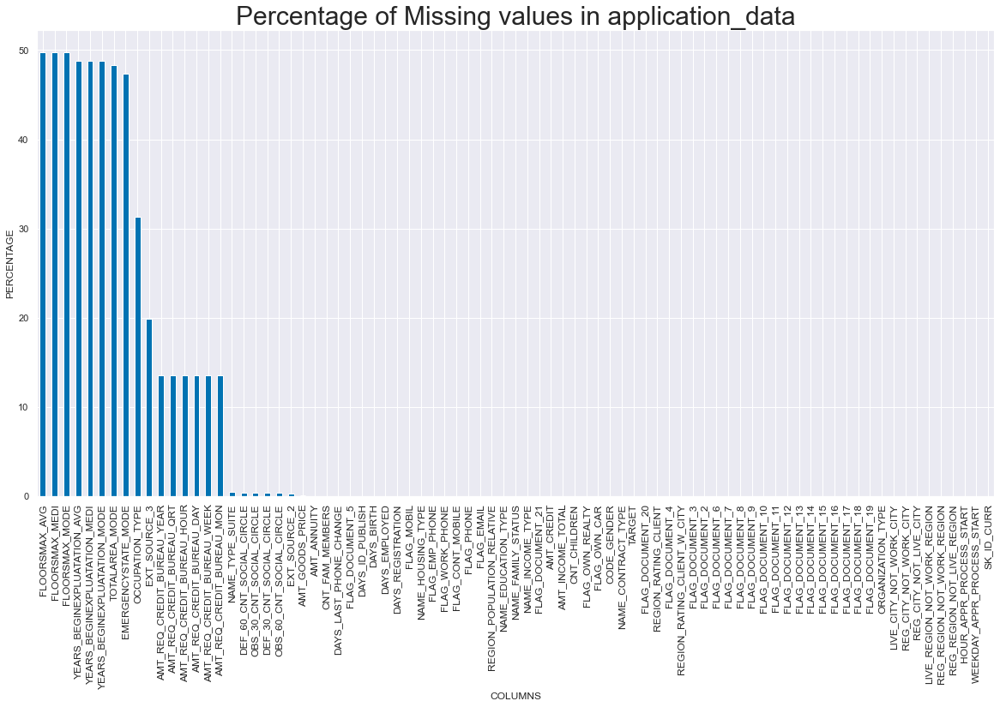

In [27]:
# Plotting the percentage of null values

fig = plt.figure(figsize=(20,10))
plt.style.use('seaborn-colorblind')
applications_missing.plot(kind='bar')
plt.xticks(rotation =90,fontsize =12)
plt.title("Percentage of Missing values in application_data", fontsize=30)
plt.ylabel("PERCENTAGE")
plt.xlabel("COLUMNS");

#### Now, we extract columns having less than 13% null values and  which can be imputed 

In [28]:
# Checking columns for which missing values can be imputed and has 13% or less null values.

null_13 = applications_missing[applications_missing.values < 13]
null_13 = null_13[null_13.values > 0]
null_13

NAME_TYPE_SUITE             0.420148
DEF_60_CNT_SOCIAL_CIRCLE    0.332021
OBS_30_CNT_SOCIAL_CIRCLE    0.332021
DEF_30_CNT_SOCIAL_CIRCLE    0.332021
OBS_60_CNT_SOCIAL_CIRCLE    0.332021
EXT_SOURCE_2                0.214626
AMT_GOODS_PRICE             0.090403
AMT_ANNUITY                 0.003902
CNT_FAM_MEMBERS             0.000650
DAYS_LAST_PHONE_CHANGE      0.000325
dtype: float64

In [29]:
# Saving 'null_13' to .csv for loading into Tableau

null_13.to_csv('null_13.csv')

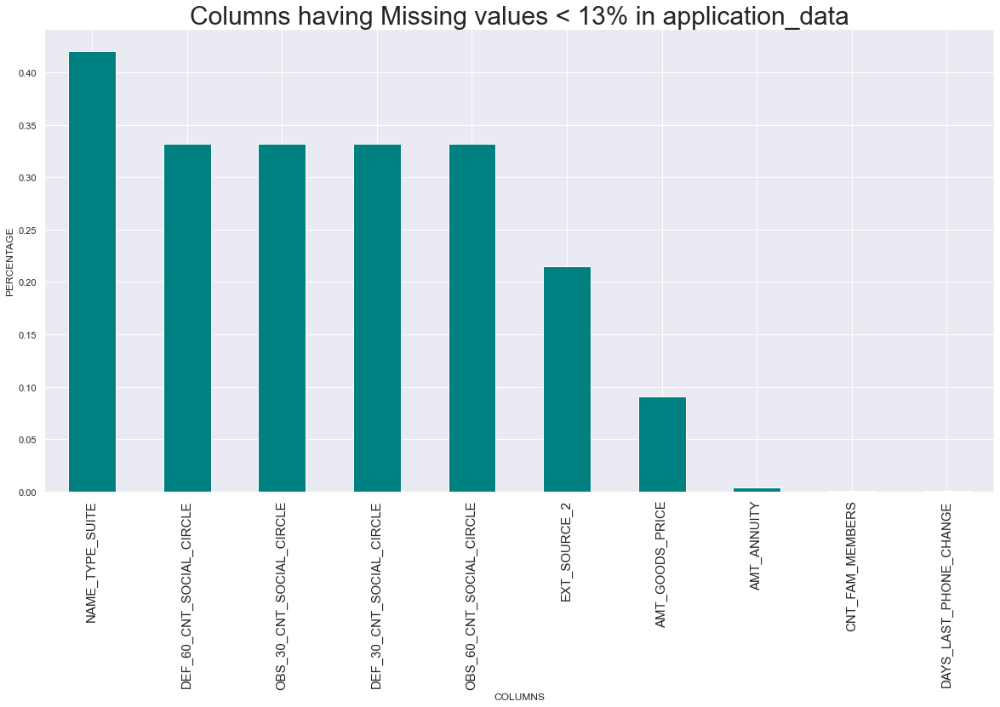

In [30]:
# Plotting the columns having less than 13% of null values

fig = plt.figure(figsize=(20,10))
plt.style.use('seaborn-colorblind')
null_13.plot(kind='bar', color='teal')
plt.xticks(rotation =90,fontsize =15)
plt.title("Columns having Missing values < 13% in application_data", fontsize=30)
plt.ylabel("PERCENTAGE")
plt.xlabel("COLUMNS");

### Inferences:
- Above 10 columns have null values less than 13%
- So, we can analyse them and suggest ways of imputing the null values
- Due to the lower percentage of null values, these columns might be helpful in drawing correct inferences regarding taking decision on loan application

#### Now, we analyse the above 10 columns and also suggest ways to impute their missing values

#### Analysis of NAME_TYPE_SUITE column

In [39]:
# Number of null values in the column

applications['NAME_TYPE_SUITE'].isnull().sum()

1292

In [40]:
# Unique values in the column and their numbers

applications['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248526
Family             40149 
Spouse, partner    11370 
Children           3267  
Other_B            1770  
Other_A            866   
Group of people    271   
Name: NAME_TYPE_SUITE, dtype: int64

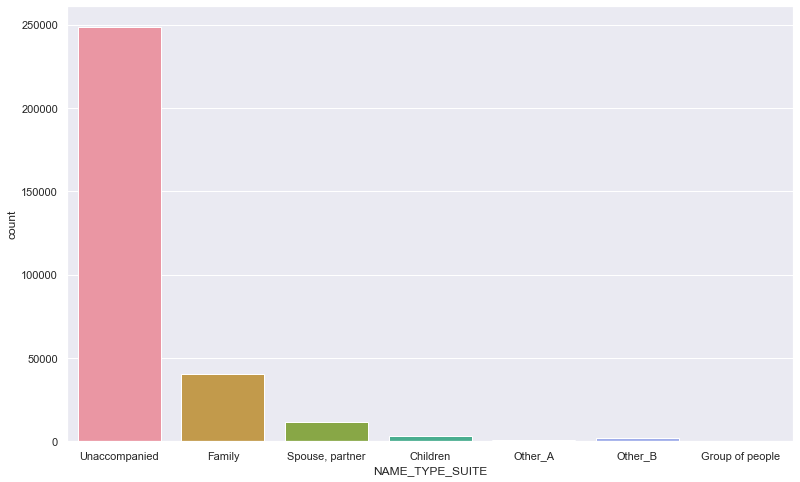

In [41]:
# Plotting the unique values

plt.figure(figsize=[13,8])
sns.set_style('darkgrid') 
sns.countplot(data=applications, x='NAME_TYPE_SUITE');


**Suggestion for imputation**:
- As the mode of this column is 'unaccompanied', we can replace the null values with ***mode***.
- `Business point of view`: 
  - A person is likely to come 'unaccompanied' while applying for a loan. 
  - Even if he/she has spouse, children, friends, etc., chances of them coming along for loan application are very less.
  - So, it is safe to assume missing values as 'Unaccompanied'.

#### Analysis of four CNT_SOCIAL_CIRCLE columns

In [42]:
# Number of null values in the four columns

social_circle = applications[['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']]
social_circle.isnull().sum()

OBS_30_CNT_SOCIAL_CIRCLE    1021
DEF_30_CNT_SOCIAL_CIRCLE    1021
OBS_60_CNT_SOCIAL_CIRCLE    1021
DEF_60_CNT_SOCIAL_CIRCLE    1021
dtype: int64

In [43]:
# See the statistical description of four columns

social_circle.describe()

,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE
count,306490.000000,306490.000000,306490.000000,306490.000000
mean,1.422245,0.143421,1.405292,0.100049
std,2.400989,0.446698,2.379803,0.362291
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,2.000000,0.000000,2.000000,0.000000
max,348.000000,34.000000,344.000000,24.000000


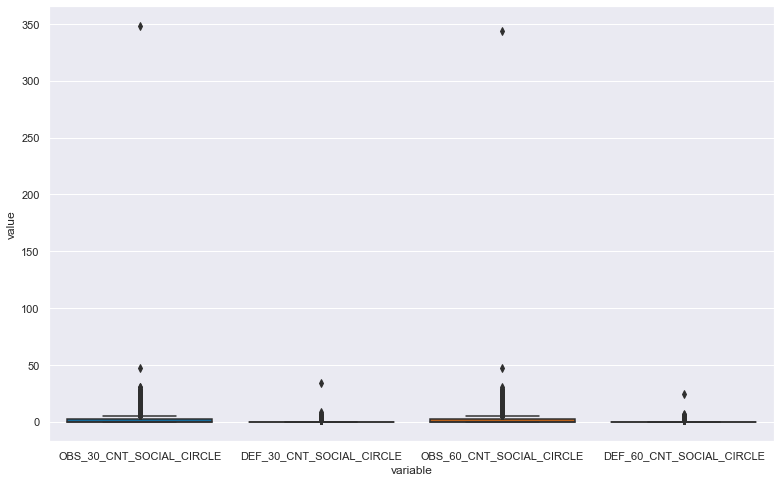

In [44]:
# Plotting the spread of four columns using boxplots

plt.figure(figsize=[13,8])
sns.set_style('darkgrid') 
sns.boxplot(x="variable", y="value", data=pd.melt(social_circle));

**Suggestion for imputation & Interpetation of Outliers**:
- As there are outliers in all the four boxplots, we ***cannot use mean*** to replace null values.
- In all these columns, we will use ***median*** to replace the null values.
- `Business point of view`:
  - Replacing the null values with median ensures that some outliers in applicants' social surrondings will not affect the chances of loan getting rejected.
  - A probable `reason for outliers` is that there are always some people in our circle or known ones who have payment difficulties. Such people are creating outliers in these columns.

#### Analysis of EXT_SOURCE_2 column

In [45]:
# Number of null values in the column

applications['EXT_SOURCE_2'].isnull().sum()

660

In [46]:
# See the statistical description of column

applications['EXT_SOURCE_2'].describe()

count    3.068510e+05
mean     5.143927e-01
std      1.910602e-01
min      8.173617e-08
25%      3.924574e-01
50%      5.659614e-01
75%      6.636171e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64

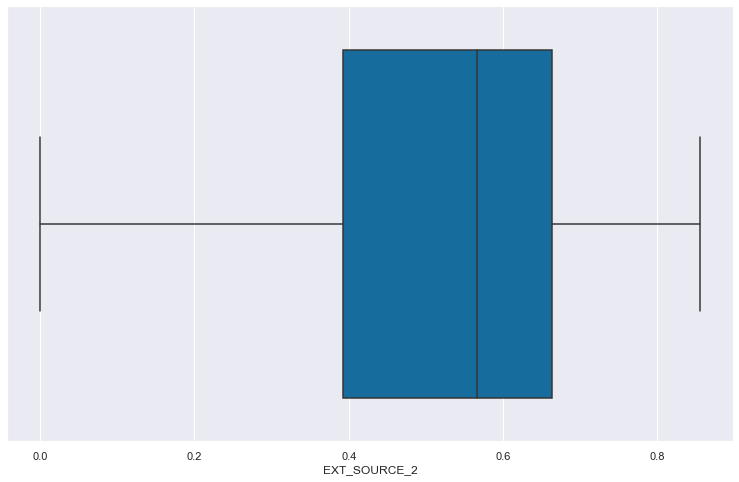

In [47]:
# Plotting the spread of column using boxplots

plt.figure(figsize=[13,8])
sns.set_style('darkgrid') 
sns.boxplot(x='EXT_SOURCE_2', data=applications);

**Suggestion for imputation & Interpetation of Outliers**:
- As there are no outliers in the boxplot, we can use ***mean*** to replace null values.
- From the decsription also, we see that *mean* and *median* are almost same. So, there is ***no harm in imputing the null values with mean**.
- `Business point of view`: Replacing the null values with mean here will ensure that we get accurate spread of the data from External Source 2, and whatever decision is taken based on that source, is not erroneous.
- The reason for `not having outliers` is that EXT_SOURCE_2 is normalized after taking from the external data source. Normalizing will result in all the values converting to values between 0 and 1. The highest will become 1 and hence, no outliers will remain after normalization.


#### Analysis of AMT_GOODS_PRICE column

In [48]:
# Number of null values in the column

applications['AMT_GOODS_PRICE'].isnull().sum()

278

In [49]:
# See the statistical description of column

applications['AMT_GOODS_PRICE'].describe()

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

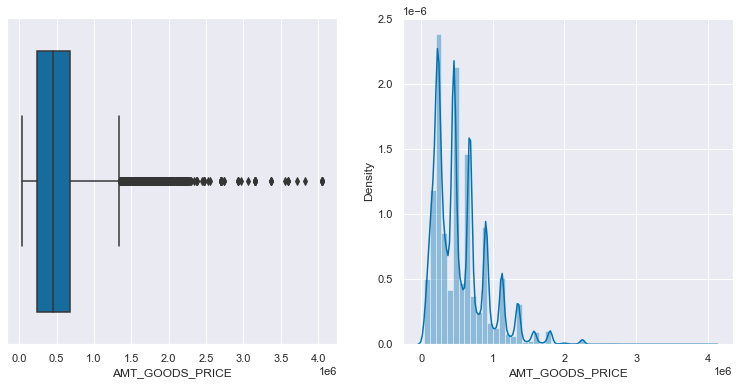

In [50]:
# Plotting the spread of column using boxplot and distplot

plt.figure(figsize=[13,6])
sns.set_style('darkgrid')

plt.subplot(1,2,1)
sns.boxplot(x='AMT_GOODS_PRICE', data=applications)

plt.subplot(1,2,2)
sns.distplot(applications['AMT_GOODS_PRICE']);

**Suggestion for imputation & Interpetation of Outliers**:
- From the boxplot, we see that there are ***many outliers*** in the boxplot, so we ***cannot use mean*** to replace null values.
- From the distplot, we see that the distribution is right-skewed and hence mean is much greater than median.
- Thus, in this column we should use **median** to impute the null values.
- `Business point of view`: Replacing the null values with median here will ensure that we get the accruate distribution of Goods Prices, ignoring the ones with higher than normal prices (outliers). The accuracy of this distribution will avoid taking incorrect decision regarding sanctioning of applicant's loan.
- The reason we are having `many outliers` is that the loan is given for varying price of goods. For example, some person may be taking loan for a two-wheeler worth Rs.70,000/- while some person may be taking loan for purchase of a 3-BHK flat of Rs.2 crores.

#### Analysis of AMT_ANNUITY column

In [51]:
# Number of null values in the column

applications['AMT_ANNUITY'].isnull().sum()

12

In [52]:
# See the statistical description of column

applications['AMT_ANNUITY'].describe()

count    307499.000000
mean     27108.573909 
std      14493.737315 
min      1615.500000  
25%      16524.000000 
50%      24903.000000 
75%      34596.000000 
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

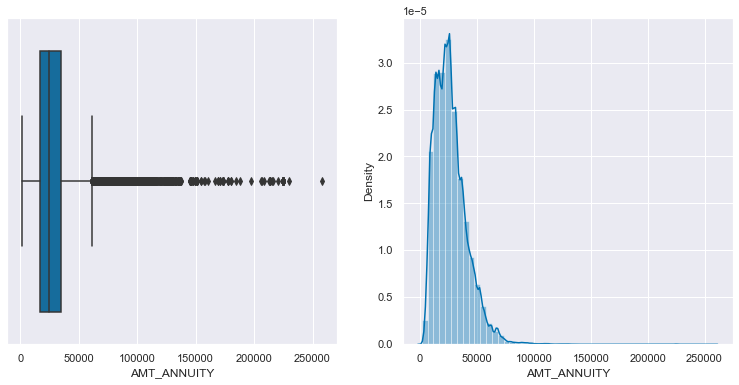

In [53]:
# Plotting the spread of column using boxplot and distplot

plt.figure(figsize=[13,6])
sns.set_style('darkgrid')

plt.subplot(1,2,1)
sns.boxplot(x='AMT_ANNUITY', data=applications)

plt.subplot(1,2,2)
sns.distplot(applications['AMT_ANNUITY']);

**Suggestion for imputation & Interpetation of Outliers**:
- From the boxplot, we see that there are ***many outliers*** in the boxplot, so we ***cannot use mean*** to replace null values.
- From the distplot, we see that the distribution is right-skewed and hence mode is mean is greater than median. This is also seen in the statistical description.
- Thus, in this column we should use **median** to impute the null values.
- `Business point of view`: Replacing the null values with median here will ensure that certain exorbitant annuity rates do not affect the decision regarding approval or rejection of applicant's loan.
- The `many outliers` found here are those people having bought annuity plans paying very high amount.

#### Analysis of CNT_FAM_MEMBERS column

In [54]:
# Number of null values in the column

applications['CNT_FAM_MEMBERS'].isnull().sum()

2

In [55]:
# See the statistical description of column

applications['CNT_FAM_MEMBERS'].describe()

count    307509.000000
mean     2.152665     
std      0.910682     
min      1.000000     
25%      2.000000     
50%      2.000000     
75%      3.000000     
max      20.000000    
Name: CNT_FAM_MEMBERS, dtype: float64

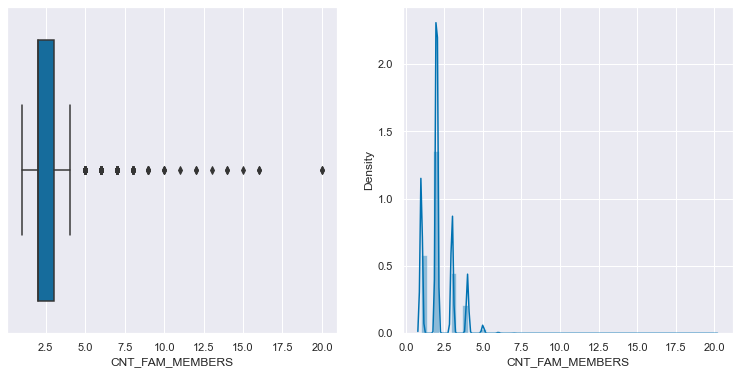

In [56]:
# Plotting the spread of column using boxplot and distplot

plt.figure(figsize=[13,6])
sns.set_style('darkgrid')

plt.subplot(1,2,1)
sns.boxplot(x='CNT_FAM_MEMBERS', data=applications)

plt.subplot(1,2,2)
sns.distplot(applications['CNT_FAM_MEMBERS']);

**Suggestion for imputation & Interpetation of Outliers**:
- Here, there are only ***two missing values***. So, even if we do not impute them, it wouldn't make much difference.   
- From the statistical description, we observe that $Mean = 2.15$ and $Median = 2.0$
- Thus, in this column we can conveniently replace the two missing values by $2.0$
- `Outliers` here show people having more number of children or people living in joint families.

#### Analysis of DAYS_LAST_PHONE_CHANGE column

In [57]:
# Number of null values in the column

applications['DAYS_LAST_PHONE_CHANGE'].isnull().sum()

1

In [58]:
# See the statistical description of column
# We will take absolute values as there are negative values for days. 

abs(applications['DAYS_LAST_PHONE_CHANGE']).describe()

count    307510.000000
mean     962.858788   
std      826.808487   
min      0.000000     
25%      274.000000   
50%      757.000000   
75%      1570.000000  
max      4292.000000  
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [59]:
# See the statistical description of column

abs(applications['DAYS_LAST_PHONE_CHANGE']).mode()

0    0.0
dtype: float64

**Suggestion for imputation**:
- Here, there is ***only one missing value***. So, even if we do not impute it, it wouldn't make much difference.   
- From the statistical description, we observe that there is ***large differnce between mean and median***.
- Thus, in this column we can conveniently replace the one missing values by **mode**, which is $0.0$.

So, till now, we have performed ***univariate analysis*** on the 10 columns having less than 13% null values and also suggested ways to ***impute null values*** and analysed ***outliers***.

### <font color=brown>Analysis of Outliers (using Univariate Analysis)</font>

#### First, we will separate Categorical and Numerical columns

In [15]:
# Store all the Categorical columns in a dataframe cat_cols

cat_cols = applications.select_dtypes(include=['object']).columns
cat_cols

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE',
       'EMERGENCYSTATE_MODE'],
      dtype='object')

In [16]:
# Store all the Numerical columns in a dataframe num_cols

num_cols = applications.describe().columns
num_cols

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG',
       'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE',
       'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
      

#### Now, we perform univariate analysis on numerical columns using Boxplots in order to analyze Outliers

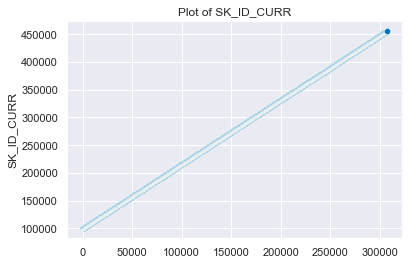

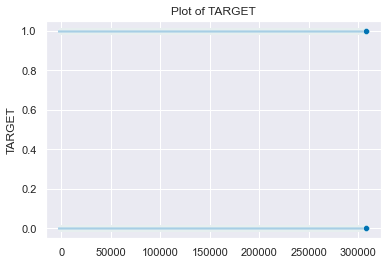

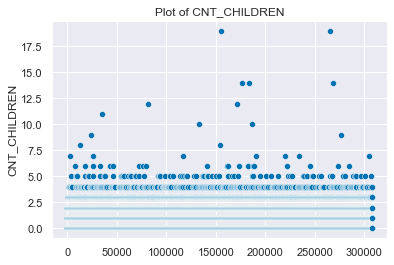

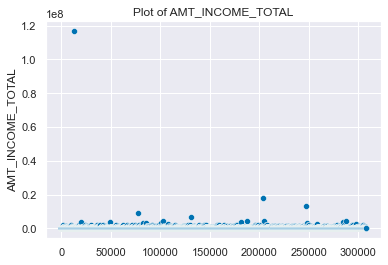

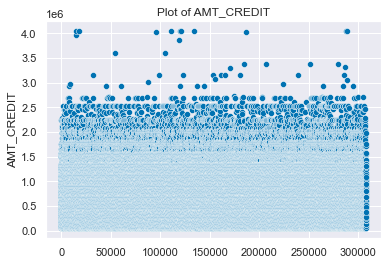

...

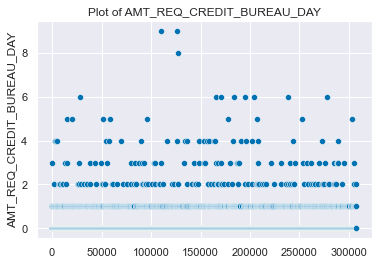

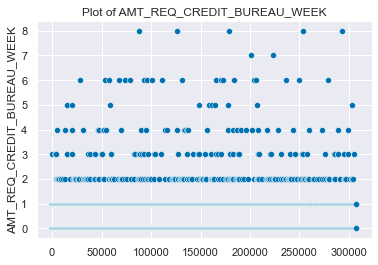

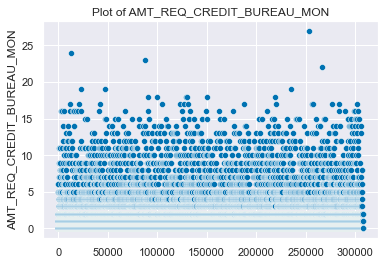

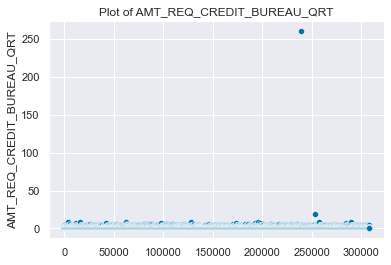

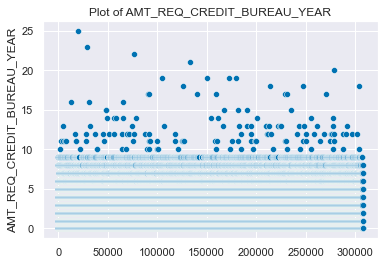

In [63]:
# We loop over all the numerical columns and create a scatter plot for each of them

for column in num_cols:
    sns.scatterplot(x=applications.index, y=applications[column], data=applications)
    plt.title("Plot of "+column)
    plt.show()
    print("=========================================================")

### **Inferences**:
Now, we will point out some driver variables from above box plots, that indicate possibility of default.

1. **'CNT_CHILDREN'**:   
 - There are many values above 10. These values are outliers.
 - Having 10 children is very unusual in the current times.
 - These applicants might be less capable to repay loans due to higher expenses.
 - `Suggestion`: Banks should ***reduce the amount of loan*** to such applicants. 
 

2. **'FLAG_MOBIL'**:  
 - There is one outlier in the graph.  
 - It is highly unlikely that someone applying for a loan doesn't have a mobile phone.  
 - It is possible that applicant has intentionally not provided his/her mobile phone number. 
 - `Suggestion`: Bank should ***deny loan*** to this customer as there are chances of default.  
 
 
3. **'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE' and 'DEF_60_CNT_SOCIAL_CIRCLE'**  
 - All these four columns have one outlier.
 - These are observations of default in applicant's social circle within 30 or 60 days past the loan due date.
 - `Suggestion`: Such people are ***risky*** to give loans to. Hence, banks may ***lend them at higher interest rates***.  
 
 
4. **'FLAG_DOCUMENT_12'**:  
 - There are two outliers in the graph.  
 - There is a possibility that this document is intentianally not provided by two customers to hide personal info.
 - For example, giving a PAN card may reveal the income tax returns, credit scores, past defaults, etc.
 - `Suggestion`: Bank should ***deny loan*** to these two customers in order to avoid possible defaults.
 
 
5. **'AMT_REQ_CREDIT_BUREAU_QTR'**:  
 - There is one outlier in the boxplot.  
 - This person has done more than 250 enquiries to Credit Bureau.  
 - Either there is an error in data entry or this person is not relaible. The person may be repeatedly inquiring for credit score just to make himself eligible for loan.
 - `Suggestion`: Bank should ***deny loan*** to this customer.

## <font color=navy blue>4. Check the imbalance percentage of target variable</font>

In [64]:
# See unique number of values in TARGET column

applications['TARGET'].value_counts() 

0    282686
1    24825 
Name: TARGET, dtype: int64

In [65]:
# Number of repayers and defaulters

print("Number of applicants paying on time:                  ", (applications['TARGET']==0).sum())
print("Number of applicants having difficulties in payment : ", (applications['TARGET']==1).sum())

Number of applicants paying on time:                   282686
Number of applicants having difficulties in payment :  24825


#### Ratio of imbalance

In [66]:
# Find the ratio of imbalance in TARGET variable

(applications['TARGET']==0).sum() / (applications['TARGET']==1).sum()

11.387150050352467

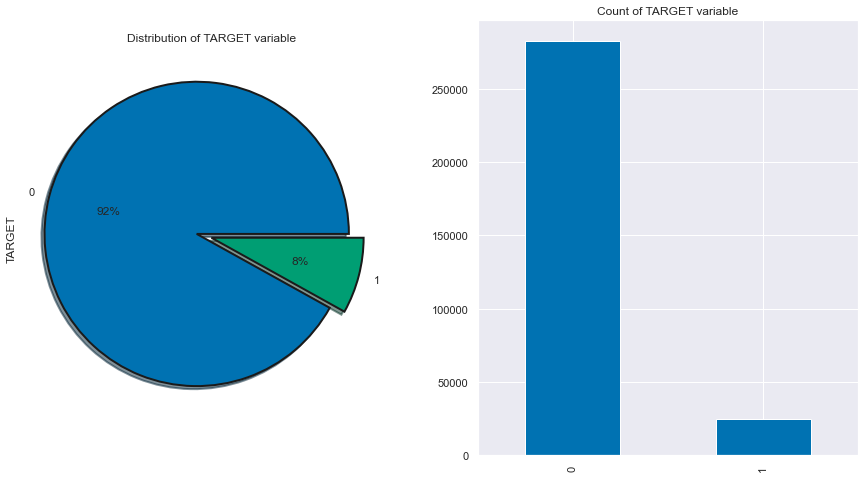

In [67]:
# Plotting of TARGET varible

plt.figure(figsize=(15,8))

# Pie-chart
plt.subplot(121)
applications["TARGET"].value_counts().plot.pie(autopct = "%1.0f%%", wedgeprops={"linewidth":2,"edgecolor":"k"},explode=[.1,0],shadow =True)
plt.title("Distribution of TARGET variable")

# Bar chart
plt.subplot(122)
applications["TARGET"].value_counts().plot.bar()

plt.title("Count of TARGET variable");

### **Inference**: 
 - The number of applicants that pay on time are approximately ***11 times*** greater than those having difficulties in loan repayment.

#### Since, there is a lot of imbalance, we will separate out these two categories of applicants.   
#### The analysis done on these two will constitute our SEGMENTED UNIVARIATE ANALYSIS

In [17]:
# Create two dataframes, one for Repayers (TARGET=0) and one for Defaulters (TARGET=1)

df_0 = applications.loc[applications['TARGET']==0]
df_1 = applications.loc[applications['TARGET']==1]

In [69]:
# Look at first few rows of Repayers

df_0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,-1588,-4970.0,-477,1,1,1,1,1,0,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.354225,0.621226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-2536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0


In [70]:
# Look at first few rows of Defaulters

df_1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,702000.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,0.018029,-18724,-2628,-6573.0,-1827,1,1,0,1,0,0,Cooking staff,1.0,3,2,MONDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.548477,0.190706,0.9732,0.0417,0.9732,0.0417,0.9732,0.0417,0.0085,Yes,10.0,1.0,10.0,0.0,-161.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,2.0,2.0
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,855000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.025164,-17482,-1262,-1182.0,-1029,1,1,0,1,0,0,Laborers,2.0,2,2,TUESDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.306841,0.320163,0.9960,0.2500,0.9960,0.2500,0.9960,0.2500,0.1463,No,0.0,0.0,0.0,0.0,-1075.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,0.0,4.0
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,238500.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.007305,-13384,-3597,-45.0,-4409,1,1,1,1,1,0,Sales staff,2.0,3,3,THURSDAY,11,0,0,0,0,0,0,Self-employed,0.674203,0.399676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,1.0,0.0,-1480.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
81,100096,1,Cash loans,F,N,Y,0,81000.0,252000.0,14593.5,252000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.028663,-24794,365243,-5391.0,-4199,1,0,0,1,0,0,NaN,2.0,2,2,THURSDAY,10,0,0,0,0,0,0,XNA,0.023952,0.720944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


#### Further in the case study, we will perform Univariate, Bivariate and Multivariate Analyses on these two dataframes df_0 and df_1

## <font color=navy blue>5. Perform Univariate analysis</font>

We will perform univariate analysis of :
1. Categorical columns  (cat_cols)
2. Numerical columns    (num_cols)

### <font color=brown>Univariate Analysis on Categorical Columns</font>

In [71]:
# First we define a function for plotting relevant plots for categorical columns

def plotting(df, df_0, df_1, col):
   
    fig = plt.figure(figsize=(13,10))
    
    # Pie-chart
    ax1 = plt.subplot(221)
    df[col].value_counts().plot.pie(autopct = "%1.0f%%", ax=ax1)
    plt.title('Plotting data for the column: ' + column)
    
    # Bar-chart (plotted in terms of absolute value)
    ax2 = plt.subplot(222)
    sns.countplot(x=col, hue='TARGET', data=df, ax=ax2)
    plt.xticks(rotation=90)
    plt.title('Plotting data for target in terms of total count')
    
    # Bar-chart (plotted in terms of percentage)
    ax3 = plt.subplot(223)
    df = pd.DataFrame()
    df['0'] = ((df_0[col].value_counts())/len(df_0)) 
    df['1'] = ((df_1[col].value_counts())/len(df_1))
    df.plot.bar(ax=ax3)
    plt.title('Plotting data for target in terms of percentage')
    
    fig.tight_layout()  
    
    plt.show()

#### Now, we run a loop through all the categorical columns and plot the above three types of charts for all columns

Plotting  NAME_CONTRACT_TYPE


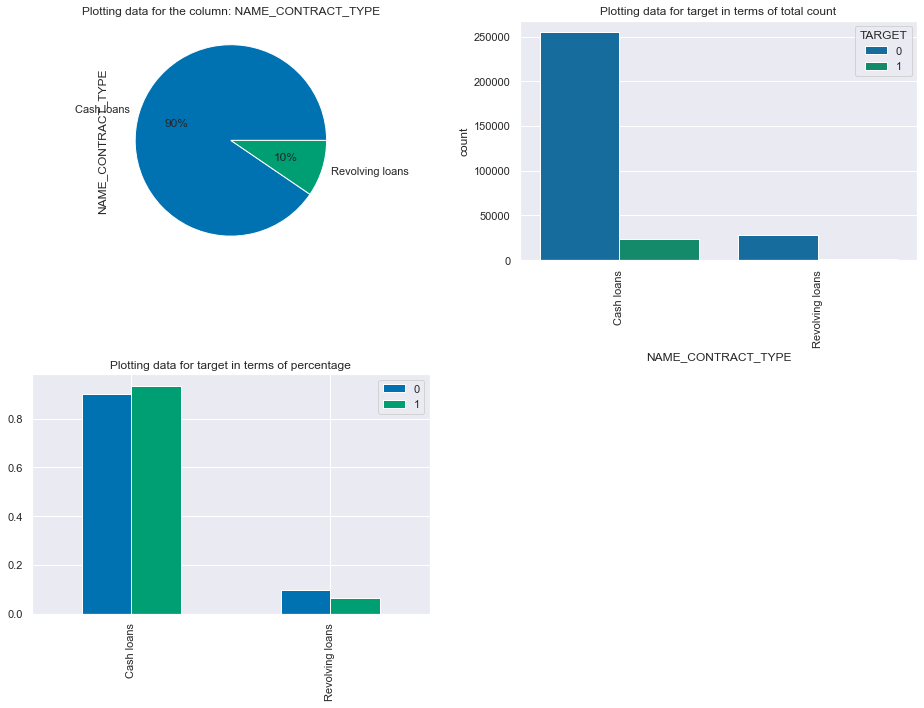

Plotting  CODE_GENDER


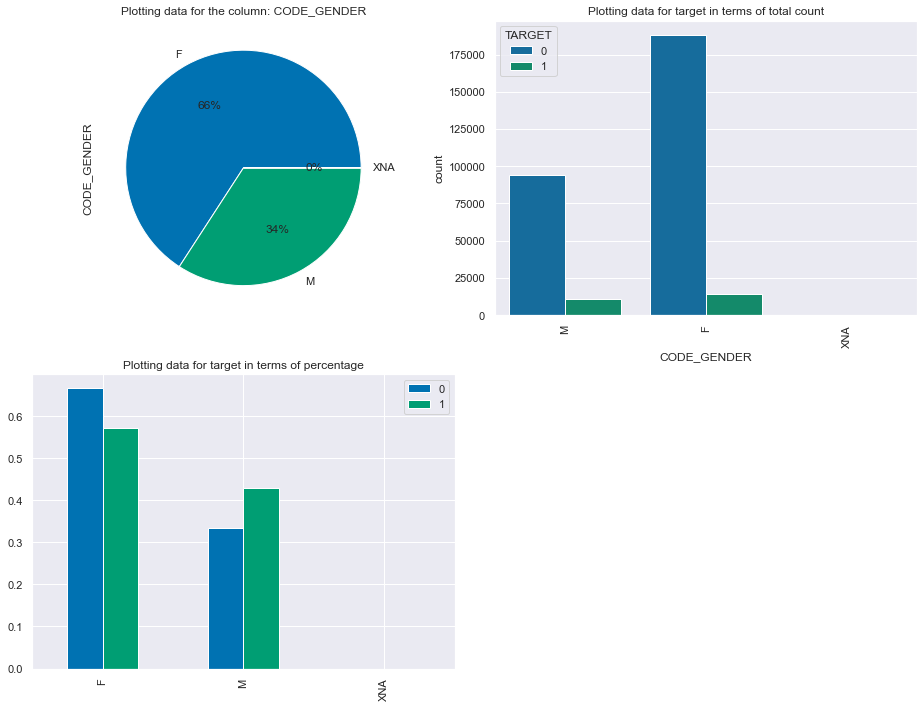

Plotting  FLAG_OWN_CAR


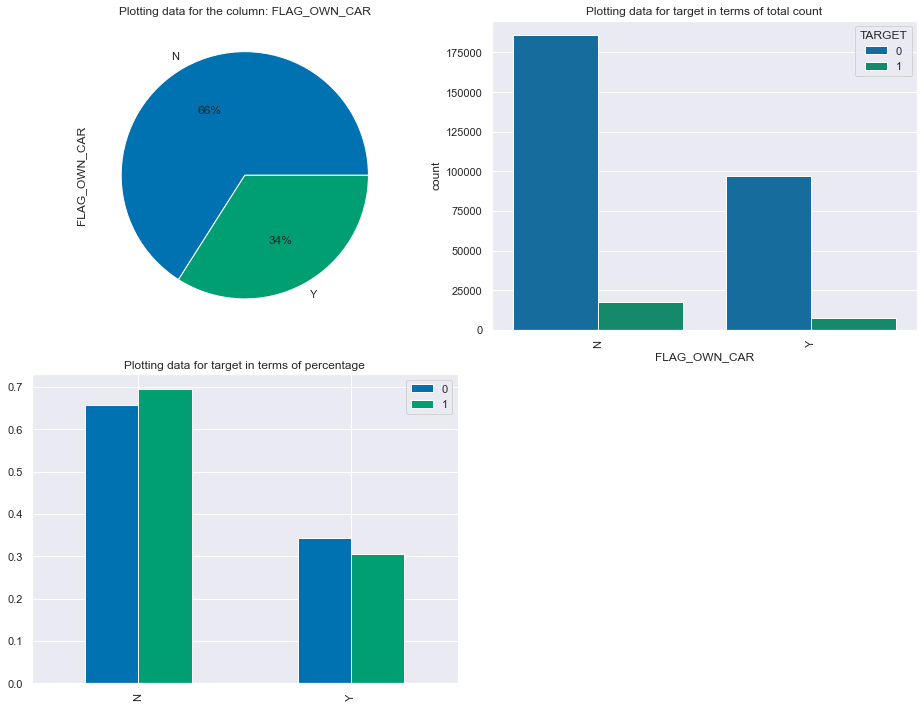

Plotting  FLAG_OWN_REALTY


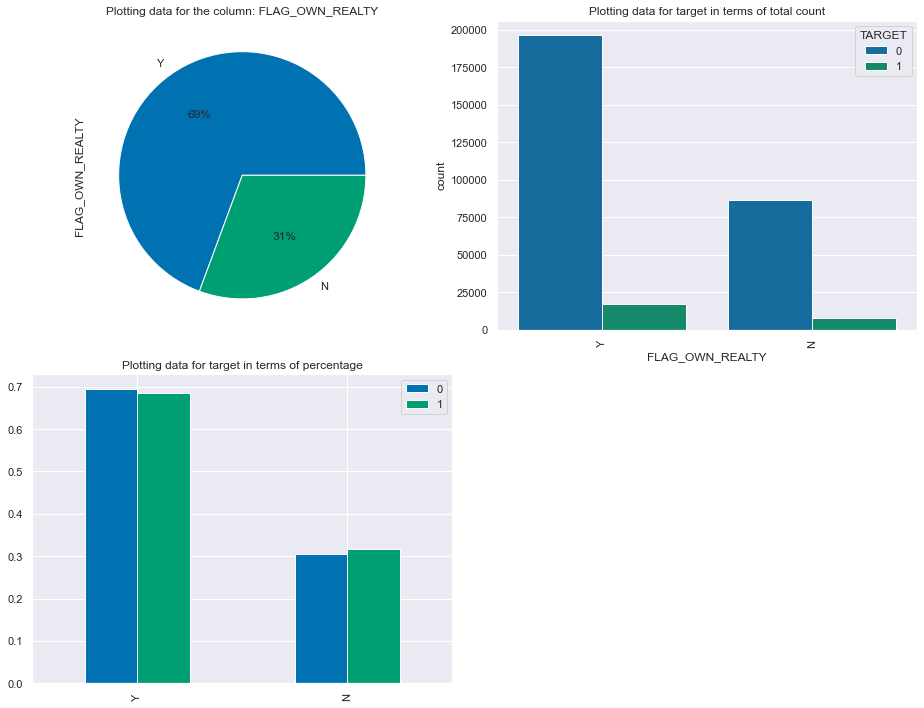

Plotting  NAME_TYPE_SUITE


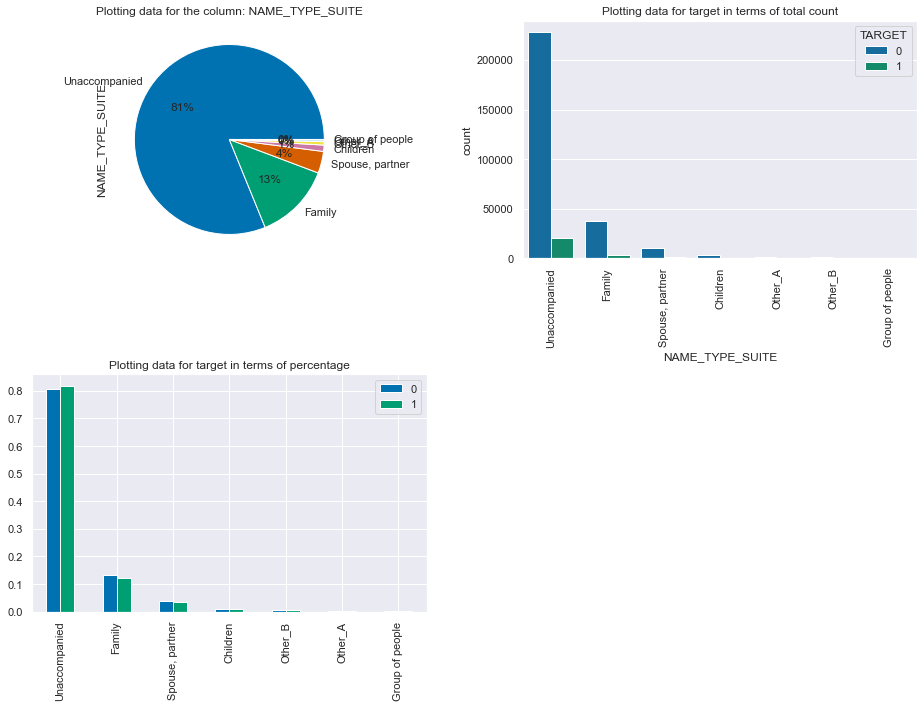

Plotting  NAME_INCOME_TYPE


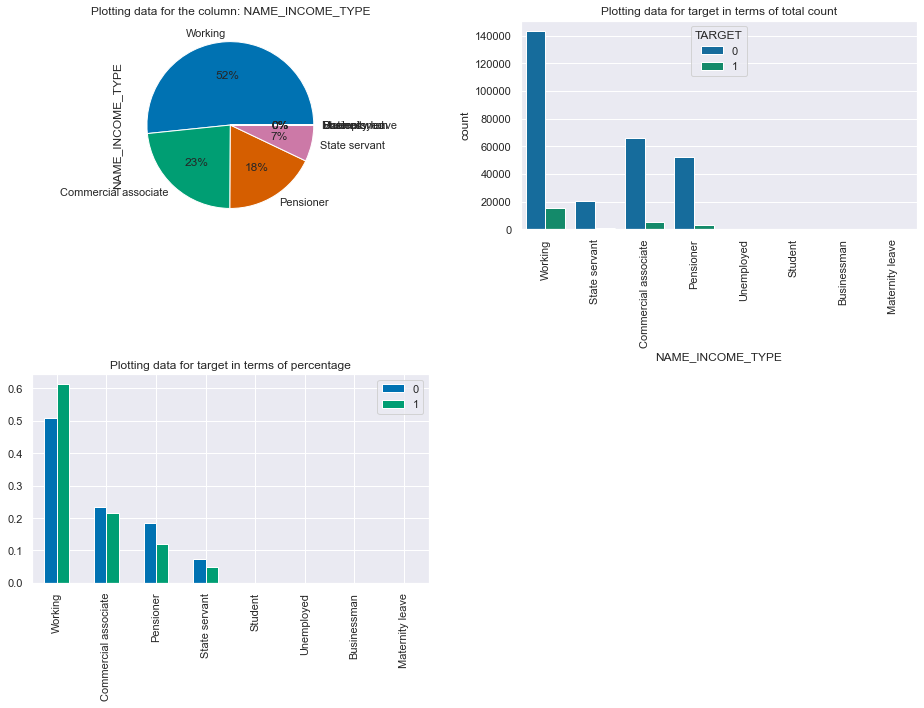

Plotting  NAME_EDUCATION_TYPE


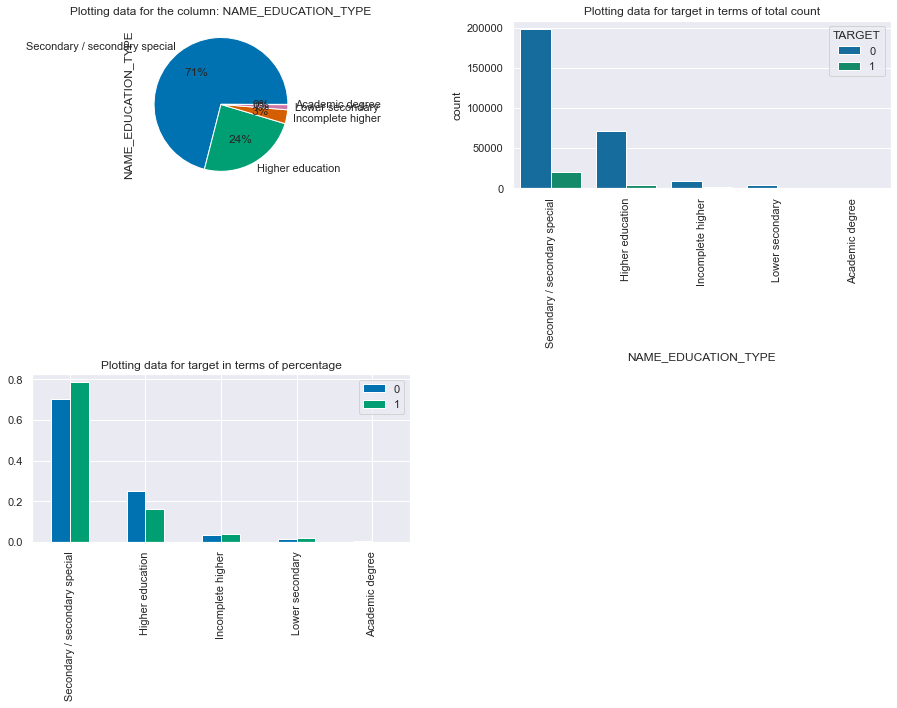

Plotting  NAME_FAMILY_STATUS


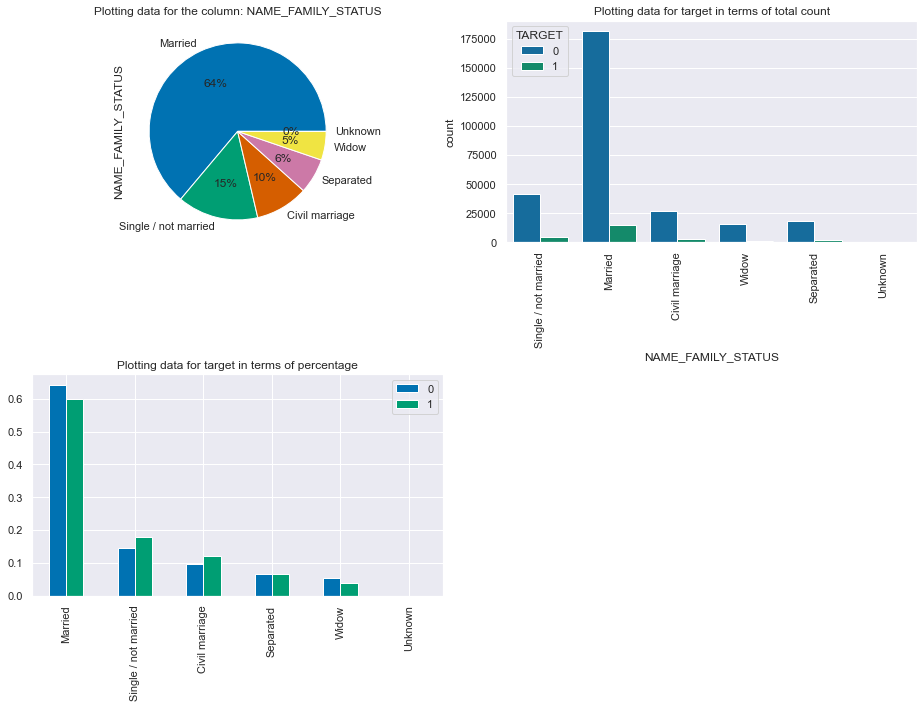

Plotting  NAME_HOUSING_TYPE


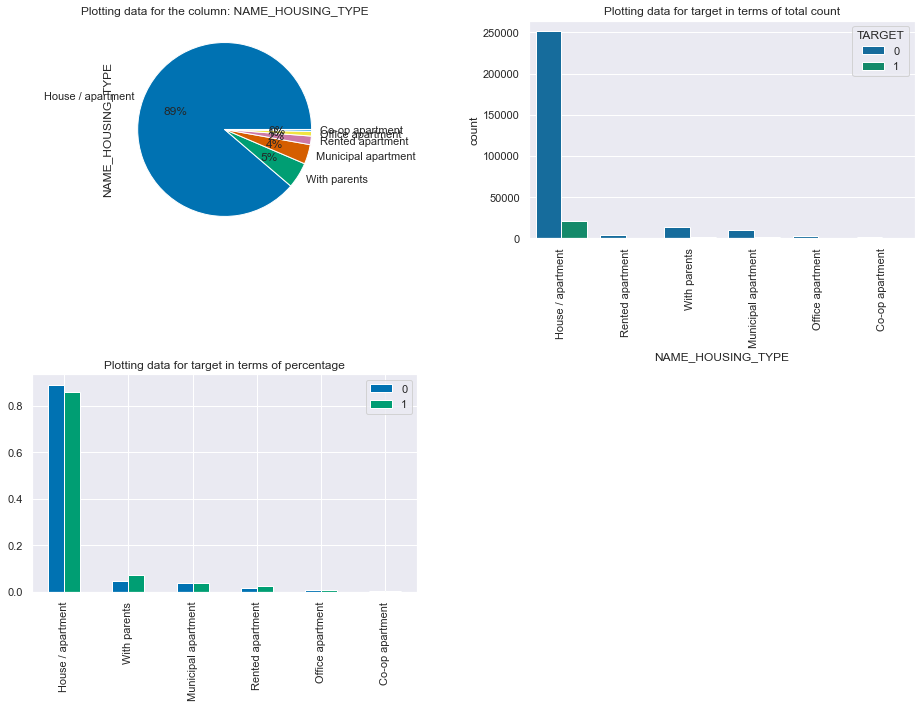

Plotting  OCCUPATION_TYPE


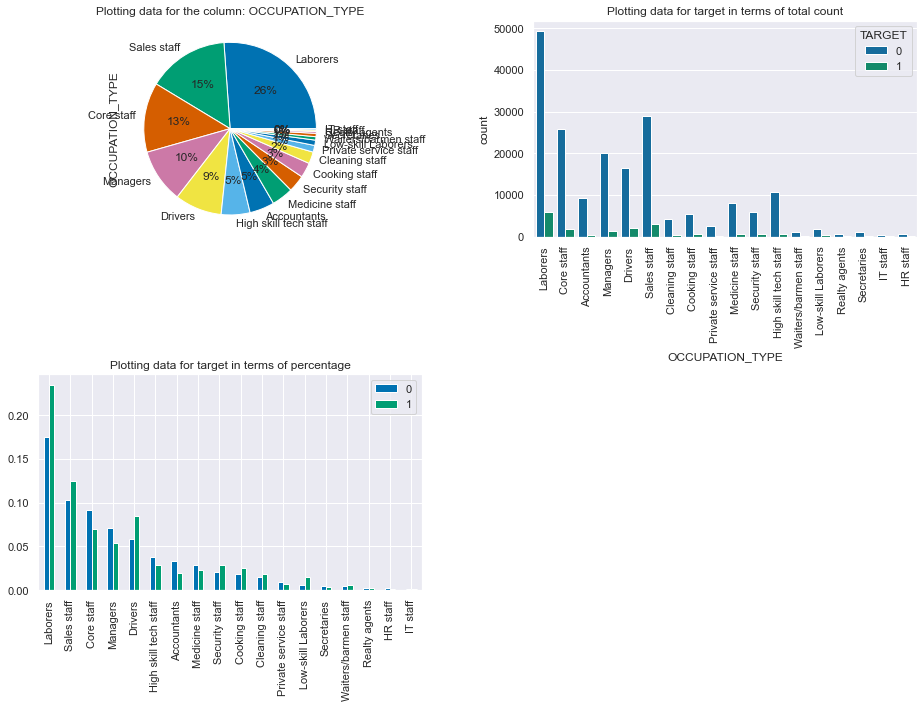

Plotting  WEEKDAY_APPR_PROCESS_START


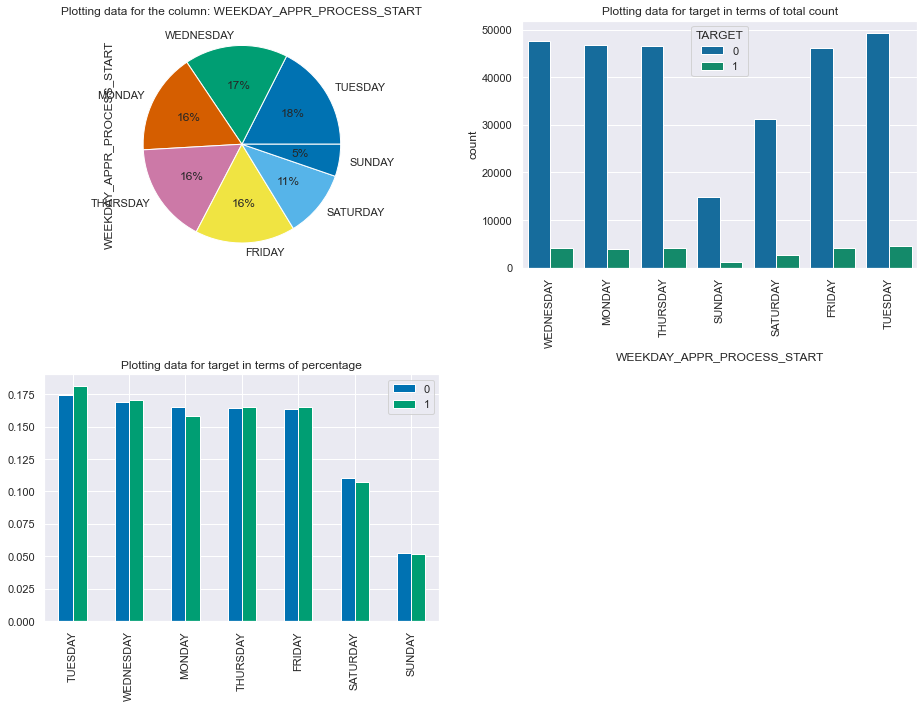

Plotting  ORGANIZATION_TYPE


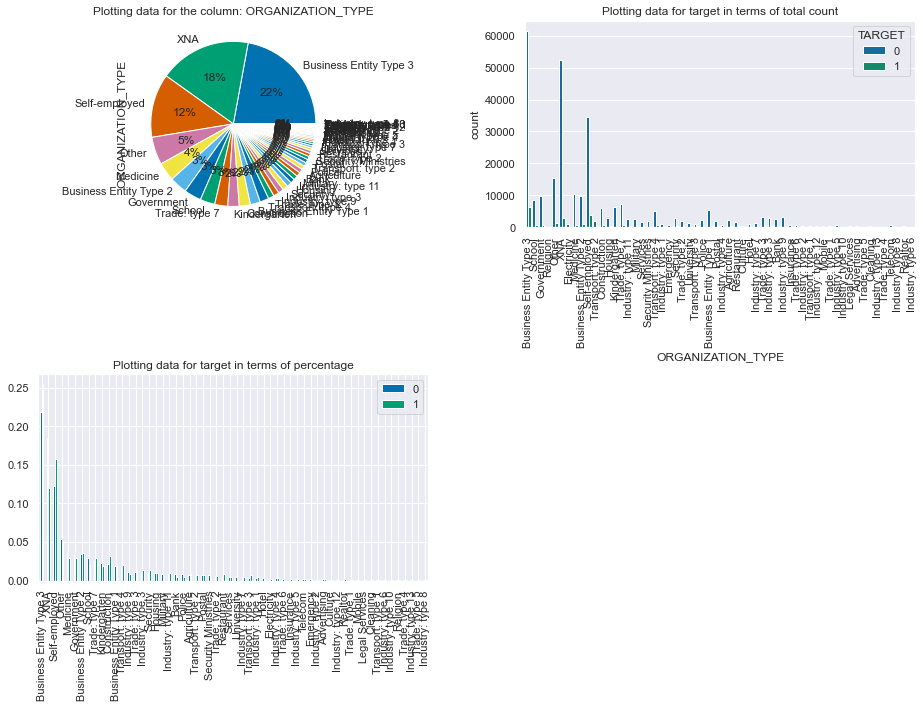

Plotting  EMERGENCYSTATE_MODE


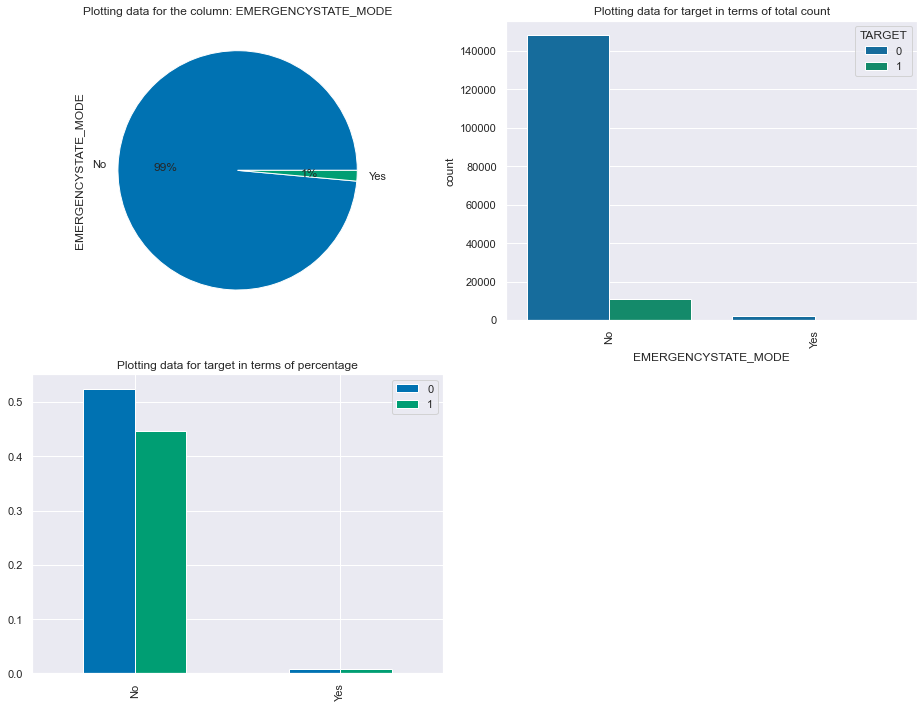

In [72]:
for column in cat_cols:
    print("Plotting ", column)
    plotting(applications, df_0, df_1, column)

### **Inferences**:
Now, we will analyse the above plots, and point out whether there is any possibility of default or not.

**'NAME_CONTRACT_TYPE'**:  
- About 90% of applicants go for cash loans.
- Probability of default also increases in cash loans.
- Although less people (10%) apply for revolving loans, they less likely to default.
- Hence, `banks should approve more revolving loans`.


**'CODE_GENDER'**:   
- More females apply for loan (66%) as compared to males (34%)
- Default rate is higher in males than in females.  
- So, females are sincere in repayment of loans compare to males.
- Hence, `banks should do more scrutiny of male applicants compared to female applicants.`

**'FLAG_OWN_CAR'**:  
- People not owning a car constitute about two-thirds of the applicants (66%).
- Chances of default increase for people not owning a car as compared to people that own a car.
- Hence, `banks may reduce loan amount of people not owning a car`.

**'FLAG_OWN_REALTY'**:  
- People owning a flat/house apply less for loans (31%).
- People not owning a flat/house have slightly higher probability of default.
- As there is not much difference in default rate, `this variable should not be used to decide whether to give a loan or not`.  

**'NAME_TYPE_SUITE'**:  
- About 81% of loan applicants come unaccompanied while applying. 
- About 13% come along with family.
- The `defaulter rate is also high among the 'unaccompanied' as they constitute a very large part of applicants`.
- Hence, bank should double check unaccompanied applicants.

**'NAME_INCOME_TYPE'**:  
- About 52% of applicants that apply for loan are working professionals, followed by Commercial Associate (23%)
- In all income types, `only working professionals have chances default higher than repayments`.  
- Hence, banks should do a thorough check of working people before giving them loans.


**'NAME_EDUCATION_TYPE'**:  
 - Most of the applicants are having Secondary Education (71%), followed by Higher Education (24%)
 - The default rate is higher in applicants with Secondary Education as compared to Higher Education.
 - Hence, `bank should scrutinize applicants with Secondary Education more before giving loans`.
 
 
**'NAME_FAMILY_STATUS'**:  
- More than half of the applicants are married.
- Moreover, married people are also good in repayment.
- Hence, `married people should be given more loans`.  

**'NAME_HOUSING_TYPE'**:  
- A major chunk of applicants (89%) live in a house or apartment.
- But there is not much difference in rate of default and rate of repayment.
- Hence, `this variable should not be used to decide whether to give a loan or not`.  

**'OCCUPATION_TYPE'**:  
- Most of the people applying for loan are Laborers. IT and HR staff are people least applying for loan.
- The default rate is more in Laborers, followed by Sales Staff and Drivers. 
- So, these `laborer applicants must be thoroughly scrutinized before giving loan`.

**'WEEKDAY_APPR_PROCESS_START'**:  
- Applicants are almost equally distributed over the days of the week, except Sunday, which might be due to bank holiday.
- This `variable will not give us insights useful for taking decision on approval of loan`.  

**'ORGANIZATION_TYPE'**:  
- There are three major types as per the pie chart: Business Entity Type3 (22%), XNA(18%) and Self-Employed (12%).
- Here XNA might be missing values.
- We `cannot get enough inferences to use this column to decide if loan can be given or not`.  

**'EMERGENCYSTATE_MODE'**:  
- Almost all the applicants are having emergency state mode as No.
- Hence, `we should not use this column to make dcision regarding loan approval`.

### <font color=brown>Univariate Analysis on Numerical Columns</font>

In [79]:
# Now we define a function for plotting relevant plots for numerical columns


def plotting1(df, df_0, df_1, col):
   
    fig = plt.figure(figsize=(15,8))
    
    # Histogram
    ax1 = plt.subplot(121)
    plt.hist(df_0[col], alpha=0.5, label='0')
    plt.hist(df_1[col], alpha=0.5, label='1')
    plt.legend()
    plt.title('Plotting Histogram for the column: ' + col, fontsize=15)
    
    # Distplot
    ax2 = plt.subplot(122)
    sns.distplot(df_0[col], label='0')
    sns.distplot(df_1[col], label='1')
    plt.legend()
    plt.title('Plotting Distplot for the column:' + col, fontsize=15)
    
    fig.tight_layout()  
    
    plt.show()

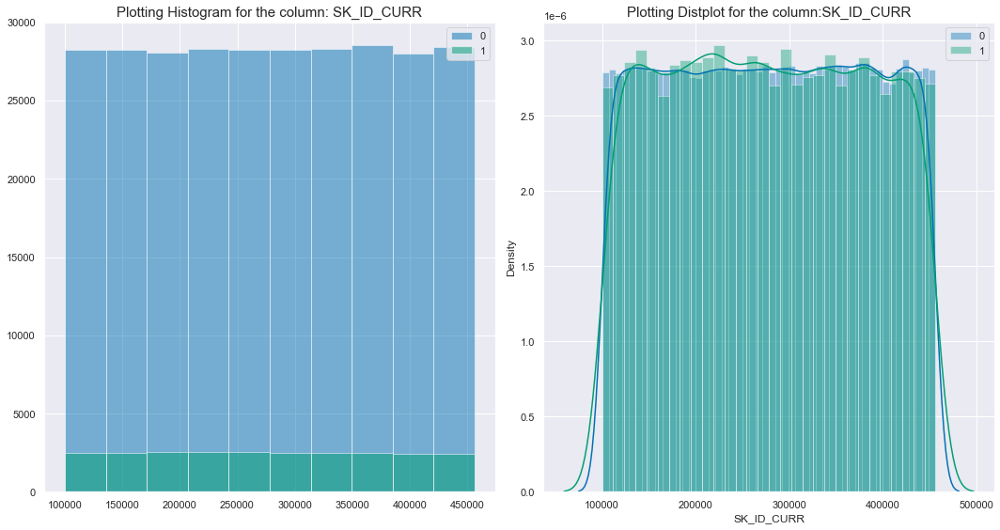

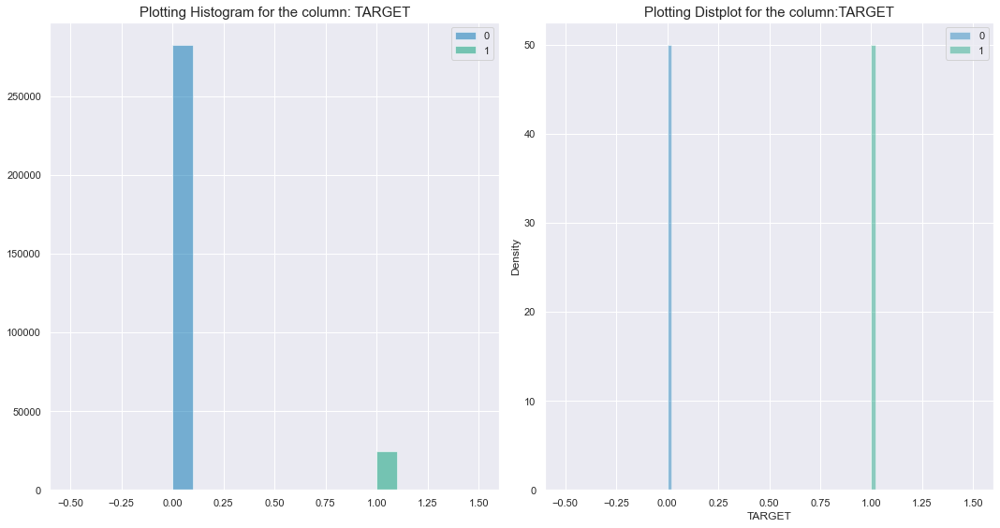

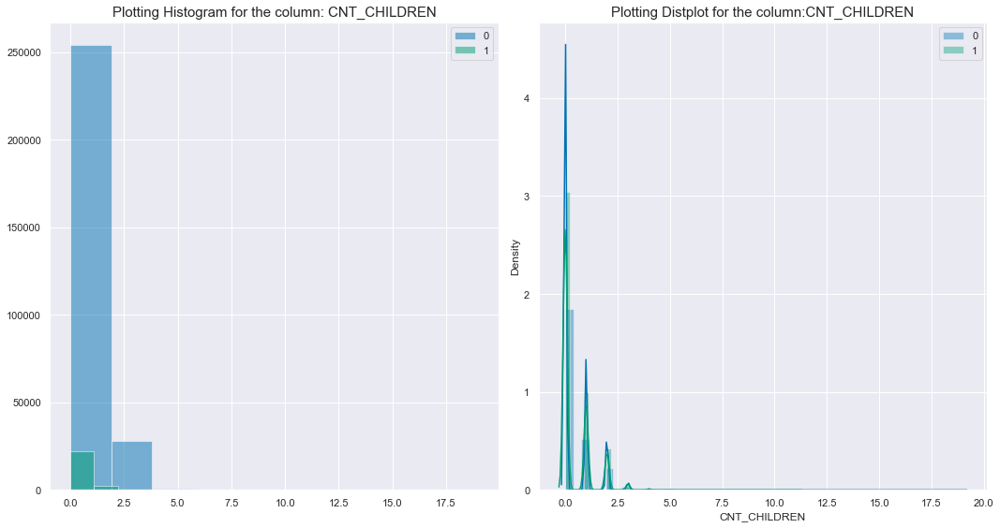

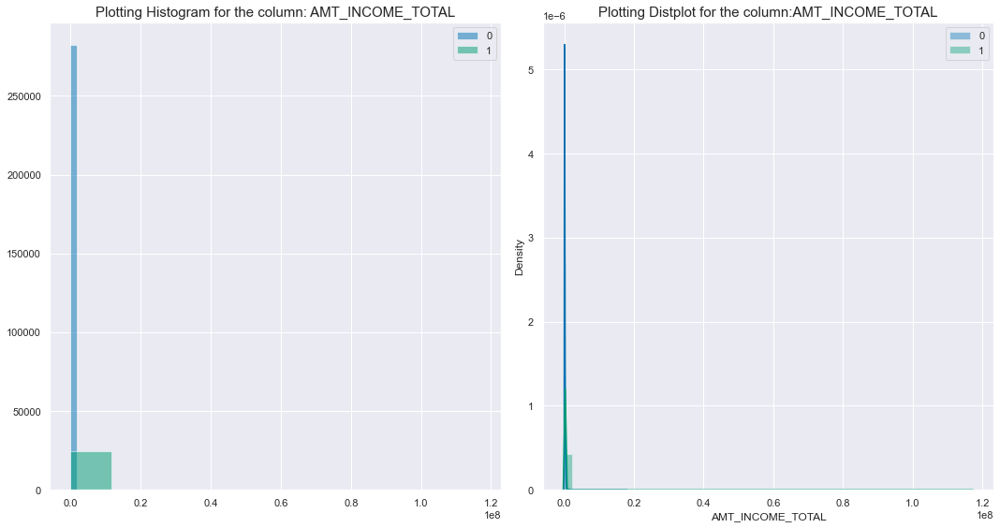

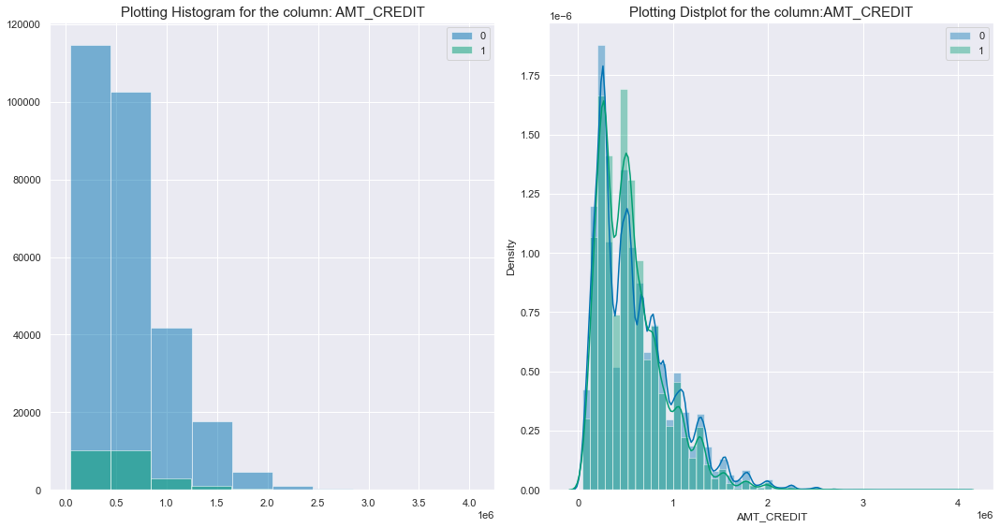

...

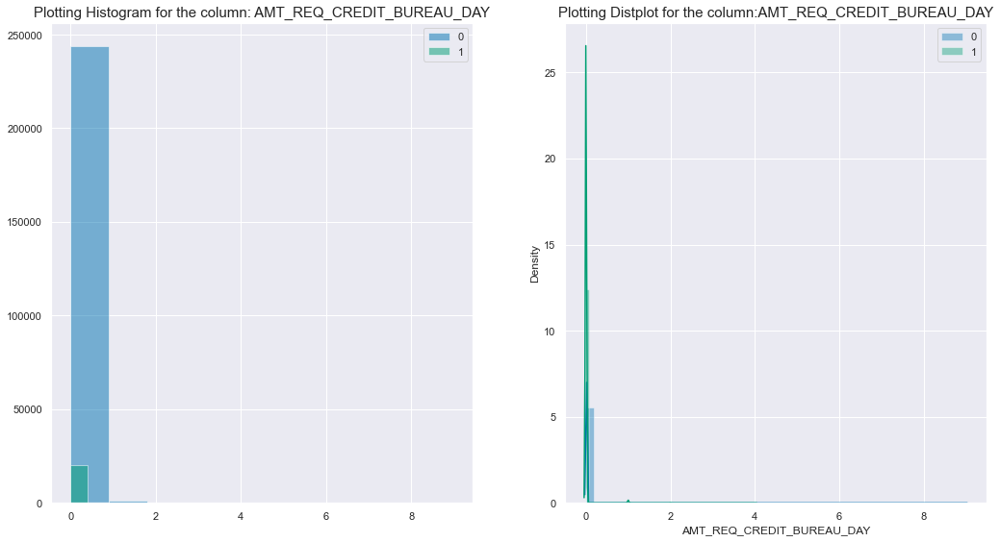

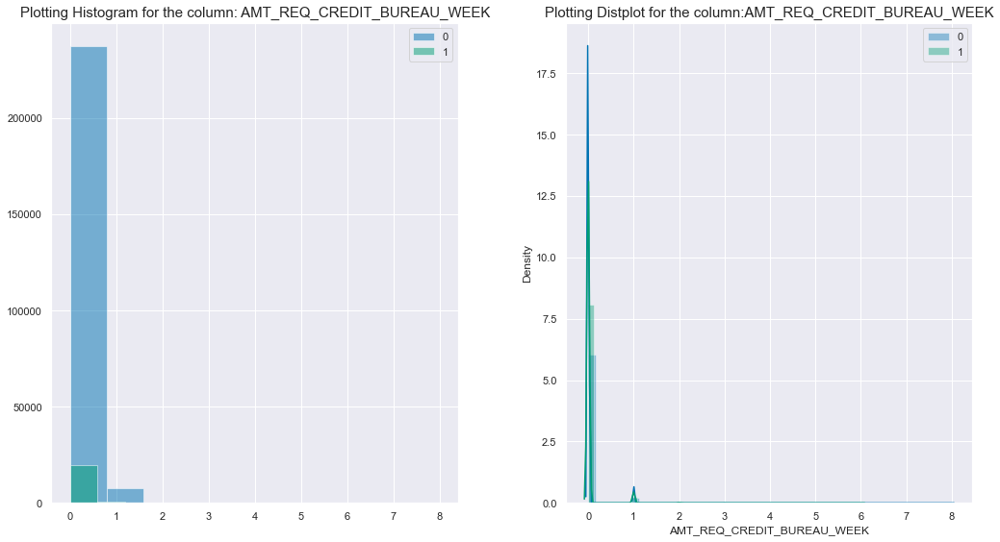

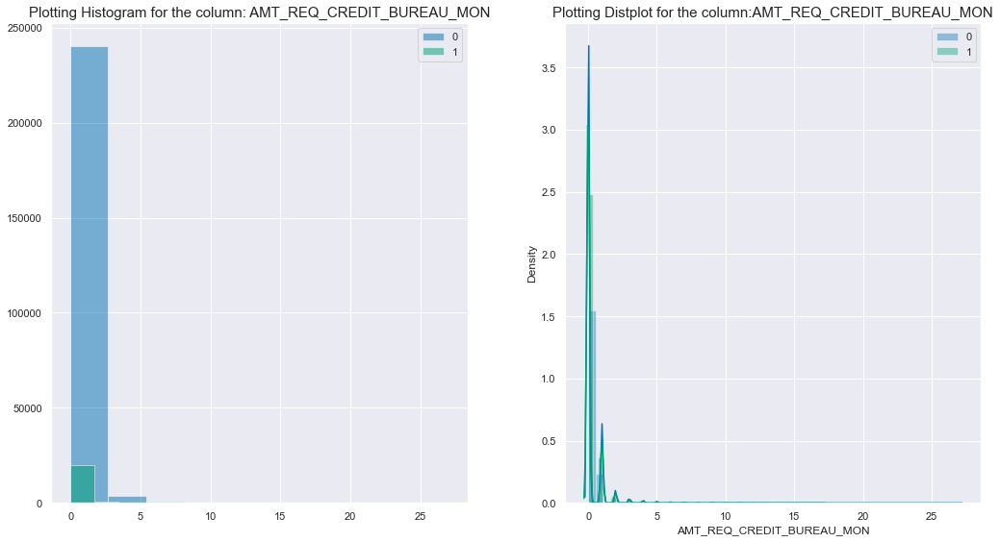

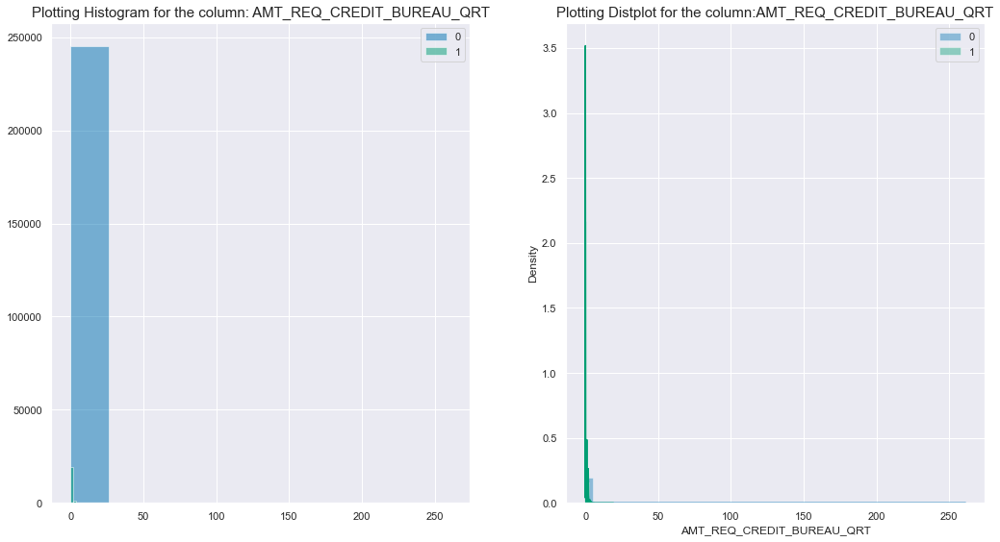

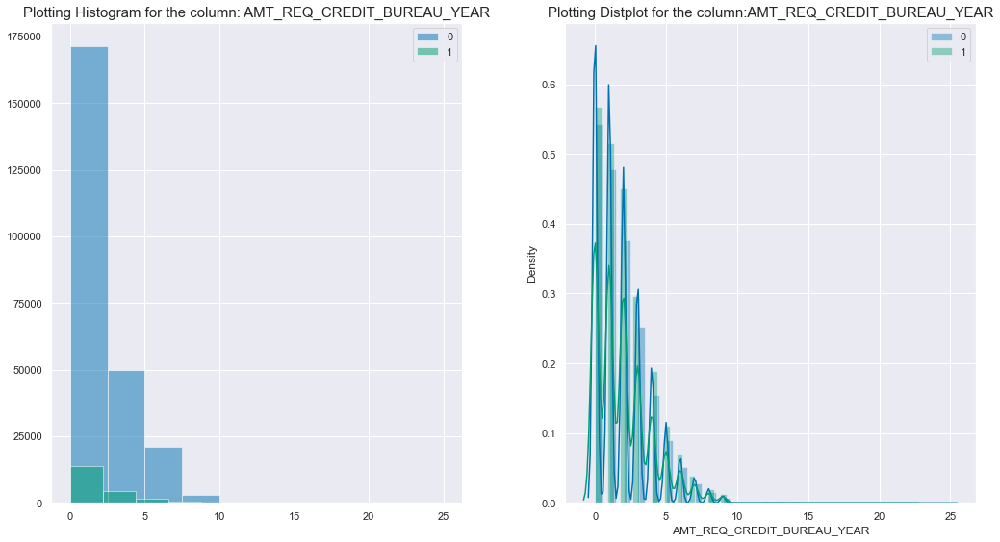

In [80]:
# Run a loop through all the numerical columns and plot the above two types of charts for all of them

for column in num_cols:
    plotting1(applications,df_0,df_1,column)   
    print("===================================================================================================================")

### **Inferences**:
Here, we will take only five columns and draw inferences from above plots.

**'CNT_CHILDREN'**:  
- The distribution is right-skewed showing that $Median < Mean$
- `Probability of default is high in people with 1 child`.


**'DAYS_EMPLOYED'**:   
- The plots show that distribution is bimodal.
- `Default rate is higher if the applicant has recently joined his/her job`.

**'AMT_REQ_CREDIT_BUREAU_QRT'**:  
- The plot shows very less defaulter among this category.
- Hence, `people who enquired Credit Bureau within last 3 months are likely to repay sincerely`.

**'DAY_LAST_PHONE_CHANGE'**:  
- This column has to be fixed to absolute values first.
- However, we can see that `as the number of days since last phone change increases, the chances of default decrease`.

**'TOTALAREA_MODE'**:  
- The plots show a right-skewed distribution.
- We can conclude that `as the area of building where applicant lives increases, the chances of default decrease`.

## <font color=navy blue>6. Perform correlation of numerical columns (Multivariate analysis)</font>

In [18]:
# Correlation Matrix of Repayers (i.e. TARGET=0)

corr = df_0.corr()
corr

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,NaN,-0.000716,0.001739,-0.000342,0.000068,-0.000205,0.000360,-0.001346,0.001744,-0.001475,-0.000077,0.002925,-0.001717,-0.000854,0.003319,0.001408,0.000229,-0.002790,-0.000519,-0.000739,-0.000115,0.000104,0.000836,0.002784,-0.002885,-0.001696,0.000428,0.001589,0.000309,0.001202,0.004096,0.001442,0.003747,0.000952,0.003810,0.002040,-0.000695,0.000556,-0.000741,0.002382,-0.000998,0.001342,-0.003217,-0.004321,-0.001426,0.001972,-0.003047,0.001618,0.002007,-0.000852,-0.001900,-0.001092,0.001006,-0.001236,0.002330,-0.000753,0.001776,0.001194,0.000676,0.000832,-0.000485,-0.001879,-0.001725,0.002524,0.000054,0.001148,0.004349
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.000716,NaN,1.000000,0.027397,0.003081,0.020905,-0.000525,-0.024363,0.336966,-0.243356,0.185792,-0.028751,0.001080,0.244274,0.055453,-0.001201,-0.029929,0.023460,0.878571,0.022842,0.021866,-0.005244,-0.012342,0.010857,0.017326,0.021587,0.072193,0.070988,-0.015455,-0.041729,0.007298,-0.008307,0.006545,-0.008199,0.006783,-0.008063,-0.006972,0.014471,-0.002246,0.014137,-0.002172,-0.008501,0.003736,0.055718,-0.003833,-0.016239,-0.158963,-0.001442,0.053919,-0.002358,-0.002859,-0.005059,0.000322,0.004340,-0.005455,0.003710,0.011775,0.001160,0.004181,0.001078,0.001302,-0.002983,-0.000432,0.000648,-0.001632,-0.010455,-0.007087,-0.042547
AMT_INCOME_TOTAL,0.001739,NaN,0.027397,1.000000,0.342799,0.418953,0.349462,0.167851,0.062609,-0.141250,0.064937,0.022896,0.000733,0.140744,-0.032404,-0.018814,0.002683,0.083705,0.034256,-0.186573,-0.200466,0.076743,0.068510,0.137174,0.127701,0.010567,0.017618,0.020684,0.139598,-0.072401,0.016485,0.181891,0.015393,0.174416,0.016431,0.180458,0.125714,-0.027828,-0.027621,-0.027690,-0.027593,-0.041338,-0.002857,-0.039251,0.001160,0.004161,-0.100271,0.009035,0.159350,0.040088,0.000637,0.005402,0.005680,0.049421,0.045590,0.023814,0.015800,0.005141,0.008214,0.005762,0.000840,-0.000869,0.001417,0.007862,0.006234,0.061470,0.013128,0.029536
AMT_CREDIT,-0.000342,NaN,0.003081,0.342799,1.000000,0.771309,0.987250,0.100604,-0.047378,-0.072515,0.013477,-0.001464,0.001498,0.071257,-0.017119,0.023096,0.026725,0.017074,0.064536,-0.103337,-0.112238,0.053619,0.024617,0.053735,0.054250,-0.025036,-0.015703,0.002506,0.129140,0.036085,0.005943,0.102921,0.004842,0.100024,0.005480,0.102374,0.072281,-0.000914,-0.019851,-0.000892,-0.022225,-0.069540,0.005490,0.100334,0.000567,-0.011750,-0.050260,-0.003613,0.084524,0.022297,-0.003243,0.028341,0.003956,0

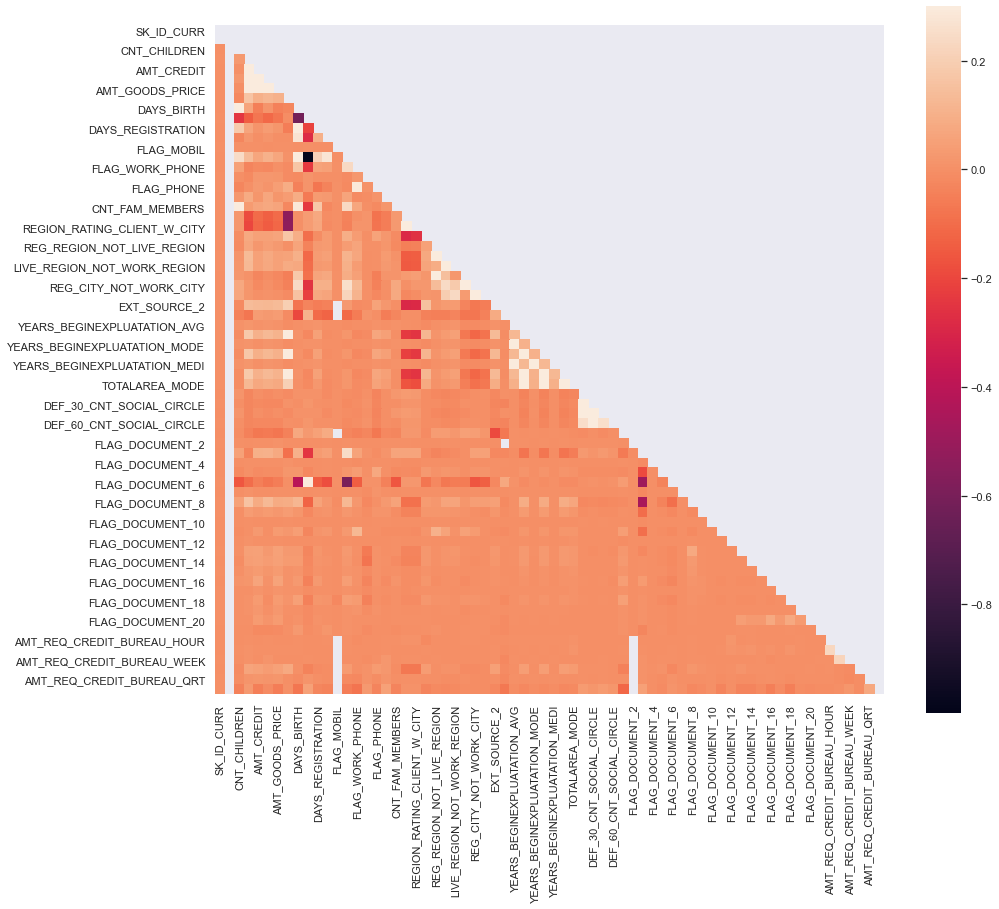

In [19]:
# Plot Heatmap of Repayers (only lower triangle)

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
f , ax =plt.subplots(figsize=(15,13))
with sns.axes_style("whitegrid"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

#### Now, we will find Top 10 correlations for applicants who repay the loan (TARGET=0)

In [83]:
df_0.corr()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,NaN,-0.000716,0.001739,-0.000342,0.000068,-0.000205,0.000360,-0.001346,0.001744,-0.001475,-0.000077,0.002925,-0.001717,-0.000854,0.003319,0.001408,0.000229,-0.002790,-0.000519,-0.000739,-0.000115,0.000104,0.000836,0.002784,-0.002885,-0.001696,0.000428,0.001589,0.000309,0.001202,0.004096,0.001442,0.003747,0.000952,0.003810,0.002040,-0.000695,0.000556,-0.000741,0.002382,-0.000998,0.001342,-0.003217,-0.004321,-0.001426,0.001972,-0.003047,0.001618,0.002007,-0.000852,-0.001900,-0.001092,0.001006,-0.001236,0.002330,-0.000753,0.001776,0.001194,0.000676,0.000832,-0.000485,-0.001879,-0.001725,0.002524,0.000054,0.001148,0.004349
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.000716,NaN,1.000000,0.027397,0.003081,0.020905,-0.000525,-0.024363,0.336966,-0.243356,0.185792,-0.028751,0.001080,0.244274,0.055453,-0.001201,-0.029929,0.023460,0.878571,0.022842,0.021866,-0.005244,-0.012342,0.010857,0.017326,0.021587,0.072193,0.070988,-0.015455,-0.041729,0.007298,-0.008307,0.006545,-0.008199,0.006783,-0.008063,-0.006972,0.014471,-0.002246,0.014137,-0.002172,-0.008501,0.003736,0.055718,-0.003833,-0.016239,-0.158963,-0.001442,0.053919,-0.002358,-0.002859,-0.005059,0.000322,0.004340,-0.005455,0.003710,0.011775,0.001160,0.004181,0.001078,0.001302,-0.002983,-0.000432,0.000648,-0.001632,-0.010455,-0.007087,-0.042547
AMT_INCOME_TOTAL,0.001739,NaN,0.027397,1.000000,0.342799,0.418953,0.349462,0.167851,0.062609,-0.141250,0.064937,0.022896,0.000733,0.140744,-0.032404,-0.018814,0.002683,0.083705,0.034256,-0.186573,-0.200466,0.076743,0.068510,0.137174,0.127701,0.010567,0.017618,0.020684,0.139598,-0.072401,0.016485,0.181891,0.015393,0.174416,0.016431,0.180458,0.125714,-0.027828,-0.027621,-0.027690,-0.027593,-0.041338,-0.002857,-0.039251,0.001160,0.004161,-0.100271,0.009035,0.159350,0.040088,0.000637,0.005402,0.005680,0.049421,0.045590,0.023814,0.015800,0.005141,0.008214,0.005762,0.000840,-0.000869,0.001417,0.007862,0.006234,0.061470,0.013128,0.029536
AMT_CREDIT,-0.000342,NaN,0.003081,0.342799,1.000000,0.771309,0.987250,0.100604,-0.047378,-0.072515,0.013477,-0.001464,0.001498,0.071257,-0.017119,0.023096,0.026725,0.017074,0.064536,-0.103337,-0.112238,0.053619,0.024617,0.053735,0.054250,-0.025036,-0.015703,0.002506,0.129140,0.036085,0.005943,0.102921,0.004842,0.100024,0.005480,0.102374,0.072281,-0.000914,-0.019851,-0.000892,-0.022225,-0.069540,0.005490,0.100334,0.000567,-0.011750,-0.050260,-0.003613,0.084524,0.022297,-0.003243,0.028341,0.003956,0

As it is not mentioned in the problem statement that the top 10 correlations are positive or negative.  
So, we will first convert all values to positive.


In [84]:
df_0.corr().abs()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,NaN,0.000716,0.001739,0.000342,0.000068,0.000205,0.000360,0.001346,0.001744,0.001475,0.000077,0.002925,0.001717,0.000854,0.003319,0.001408,0.000229,0.002790,0.000519,0.000739,0.000115,0.000104,0.000836,0.002784,0.002885,0.001696,0.000428,0.001589,0.000309,0.001202,0.004096,0.001442,0.003747,0.000952,0.003810,0.002040,0.000695,0.000556,0.000741,0.002382,0.000998,0.001342,0.003217,0.004321,0.001426,0.001972,0.003047,0.001618,0.002007,0.000852,0.001900,0.001092,0.001006,0.001236,0.002330,0.000753,0.001776,0.001194,0.000676,0.000832,0.000485,0.001879,0.001725,0.002524,0.000054,0.001148,0.004349
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,0.000716,NaN,1.000000,0.027397,0.003081,0.020905,0.000525,0.024363,0.336966,0.243356,0.185792,0.028751,0.001080,0.244274,0.055453,0.001201,0.029929,0.023460,0.878571,0.022842,0.021866,0.005244,0.012342,0.010857,0.017326,0.021587,0.072193,0.070988,0.015455,0.041729,0.007298,0.008307,0.006545,0.008199,0.006783,0.008063,0.006972,0.014471,0.002246,0.014137,0.002172,0.008501,0.003736,0.055718,0.003833,0.016239,0.158963,0.001442,0.053919,0.002358,0.002859,0.005059,0.000322,0.004340,0.005455,0.003710,0.011775,0.001160,0.004181,0.001078,0.001302,0.002983,0.000432,0.000648,0.001632,0.010455,0.007087,0.042547
AMT_INCOME_TOTAL,0.001739,NaN,0.027397,1.000000,0.342799,0.418953,0.349462,0.167851,0.062609,0.141250,0.064937,0.022896,0.000733,0.140744,0.032404,0.018814,0.002683,0.083705,0.034256,0.186573,0.200466,0.076743,0.068510,0.137174,0.127701,0.010567,0.017618,0.020684,0.139598,0.072401,0.016485,0.181891,0.015393,0.174416,0.016431,0.180458,0.125714,0.027828,0.027621,0.027690,0.027593,0.041338,0.002857,0.039251,0.001160,0.004161,0.100271,0.009035,0.159350,0.040088,0.000637,0.005402,0.005680,0.049421,0.045590,0.023814,0.015800,0.005141,0.008214,0.005762,0.000840,0.000869,0.001417,0.007862,0.006234,0.061470,0.013128,0.029536
AMT_CREDIT,0.000342,NaN,0.003081,0.342799,1.000000,0.771309,0.987250,0.100604,0.047378,0.072515,0.013477,0.001464,0.001498,0.071257,0.017119,0.023096,0.026725,0.017074,0.064536,0.103337,0.112238,0.053619,0.024617,0.053735,0.054250,0.025036,0.015703,0.002506,0.129140,0.036085,0.005943,0.102921,0.004842,0.100024,0.005480,0.102374,0.072281,0.000914,0.019851,0.000892,0.022225,0.069540,0.005490,0.100334,0.000567,0.011750,0.050260,0.003613,0.084524,0.022297,0.003243,0.028341,0.003956,0.053726,0.047987,0.032411,0.062477,0.012188,0.035527,0.021560,0.032151,0.015602,0.003734,0.004

In [85]:
# Unstack the correlation matrix 
# Unstack operation is the reverse of pivot

df_0.corr().abs().unstack()

SK_ID_CURR                    SK_ID_CURR                      1.000000
                              TARGET                         NaN      
                              CNT_CHILDREN                    0.000716
                              AMT_INCOME_TOTAL                0.001739
                              AMT_CREDIT                      0.000342
                              AMT_ANNUITY                     0.000068
                              AMT_GOODS_PRICE                 0.000205
                              REGION_POPULATION_RELATIVE      0.000360
                              DAYS_BIRTH                      0.001346
                              DAYS_EMPLOYED                   0.001744
                              DAYS_REGISTRATION               0.001475
                              DAYS_ID_PUBLISH                 0.000077
                              FLAG_MOBIL                      0.002925
                              FLAG_EMP_PHONE                  0.001717
      

In [86]:
# Sort the unstacked values

df_0.corr().abs().unstack().sort_values(kind='quicksort')

EXT_SOURCE_2                  FLAG_DOCUMENT_2                 0.000004
FLAG_DOCUMENT_2               EXT_SOURCE_2                    0.000004
FLAG_MOBIL                    FLAG_DOCUMENT_12                0.000005
FLAG_DOCUMENT_12              FLAG_MOBIL                      0.000005
FLAG_DOCUMENT_4               YEARS_BEGINEXPLUATATION_MEDI    0.000008
YEARS_BEGINEXPLUATATION_MEDI  FLAG_DOCUMENT_4                 0.000008
FLAG_MOBIL                    FLAG_DOCUMENT_10                0.000009
FLAG_DOCUMENT_10              FLAG_MOBIL                      0.000009
FLAG_DOCUMENT_2               FLAG_MOBIL                      0.000011
FLAG_MOBIL                    FLAG_DOCUMENT_2                 0.000011
FLAG_DOCUMENT_10              FLAG_DOCUMENT_12                0.000013
FLAG_DOCUMENT_12              FLAG_DOCUMENT_10                0.000013
                              FLAG_DOCUMENT_2                 0.000015
FLAG_DOCUMENT_2               FLAG_DOCUMENT_12                0.000015
FLAG_M

In [20]:
# Drop missing values from sorted unstacked values

correlation_0 = df_0.corr().abs().unstack().sort_values(kind='quicksort').dropna()
correlation_0

EXT_SOURCE_2                  FLAG_DOCUMENT_2                 0.000004
FLAG_DOCUMENT_2               EXT_SOURCE_2                    0.000004
FLAG_MOBIL                    FLAG_DOCUMENT_12                0.000005
FLAG_DOCUMENT_12              FLAG_MOBIL                      0.000005
FLAG_DOCUMENT_4               YEARS_BEGINEXPLUATATION_MEDI    0.000008
YEARS_BEGINEXPLUATATION_MEDI  FLAG_DOCUMENT_4                 0.000008
FLAG_MOBIL                    FLAG_DOCUMENT_10                0.000009
FLAG_DOCUMENT_10              FLAG_MOBIL                      0.000009
FLAG_DOCUMENT_2               FLAG_MOBIL                      0.000011
FLAG_MOBIL                    FLAG_DOCUMENT_2                 0.000011
FLAG_DOCUMENT_10              FLAG_DOCUMENT_12                0.000013
FLAG_DOCUMENT_12              FLAG_DOCUMENT_10                0.000013
                              FLAG_DOCUMENT_2                 0.000015
FLAG_DOCUMENT_2               FLAG_DOCUMENT_12                0.000015
FLAG_M

#### As many bottom rows have correlation values 1, they are useless to us, as they show the correlation of a variable with itself.   
#### So, we will removes values having correlation 1.

In [21]:
# Values of correlation except 1 (i.e.  having correlation with themselves)

correlation_0 = correlation_0[correlation_0 != 1.0]
correlation_0

EXT_SOURCE_2                  FLAG_DOCUMENT_2                 0.000004
FLAG_DOCUMENT_2               EXT_SOURCE_2                    0.000004
FLAG_MOBIL                    FLAG_DOCUMENT_12                0.000005
FLAG_DOCUMENT_12              FLAG_MOBIL                      0.000005
FLAG_DOCUMENT_4               YEARS_BEGINEXPLUATATION_MEDI    0.000008
YEARS_BEGINEXPLUATATION_MEDI  FLAG_DOCUMENT_4                 0.000008
FLAG_MOBIL                    FLAG_DOCUMENT_10                0.000009
FLAG_DOCUMENT_10              FLAG_MOBIL                      0.000009
FLAG_DOCUMENT_2               FLAG_MOBIL                      0.000011
FLAG_MOBIL                    FLAG_DOCUMENT_2                 0.000011
FLAG_DOCUMENT_10              FLAG_DOCUMENT_12                0.000013
FLAG_DOCUMENT_12              FLAG_DOCUMENT_10                0.000013
                              FLAG_DOCUMENT_2                 0.000015
FLAG_DOCUMENT_2               FLAG_DOCUMENT_12                0.000015
FLAG_M

### Top 10 correlation of Repayers

In [22]:
# Top 10 values of correlation (TARGET=0)


correlation_0 = df_0.corr().abs().unstack().sort_values(kind='quicksort').dropna()
correlation_0 = correlation_0[correlation_0 != 1.0]
correlation_0.tail(10)

FLOORSMAX_MEDI                FLOORSMAX_MODE                  0.988153
FLOORSMAX_MODE                FLOORSMAX_MEDI                  0.988153
YEARS_BEGINEXPLUATATION_MEDI  YEARS_BEGINEXPLUATATION_AVG     0.993582
YEARS_BEGINEXPLUATATION_AVG   YEARS_BEGINEXPLUATATION_MEDI    0.993582
FLOORSMAX_AVG                 FLOORSMAX_MEDI                  0.997018
FLOORSMAX_MEDI                FLOORSMAX_AVG                   0.997018
OBS_60_CNT_SOCIAL_CIRCLE      OBS_30_CNT_SOCIAL_CIRCLE        0.998508
OBS_30_CNT_SOCIAL_CIRCLE      OBS_60_CNT_SOCIAL_CIRCLE        0.998508
DAYS_EMPLOYED                 FLAG_EMP_PHONE                  0.999758
FLAG_EMP_PHONE                DAYS_EMPLOYED                   0.999758
dtype: float64

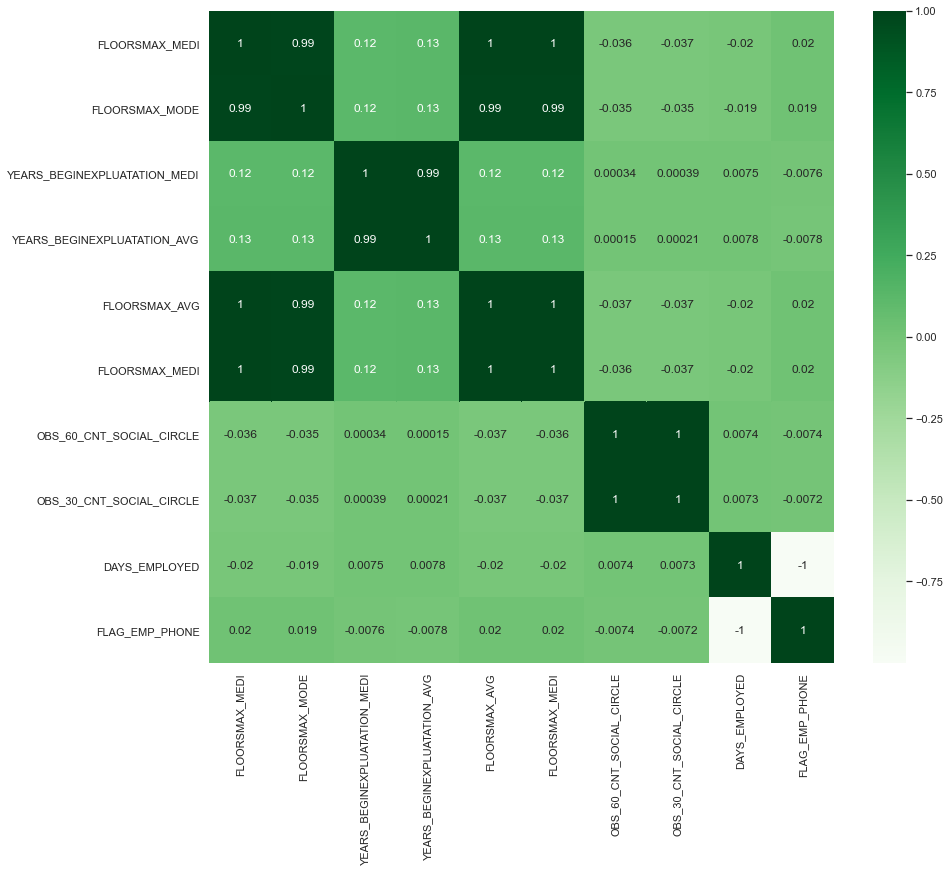

In [28]:
# Plotting a heatmap of top 10 values of correlation among Repayers

res = correlation_0.tail(10).droplevel(1).index
df_0[res].corr()

plt.figure(figsize=[14,12])
sns.heatmap(df_0[res].corr(), annot=True, cmap='Greens');

#### Similarly, we will find Top 10 correlations for applicants who default (TARGET=1)

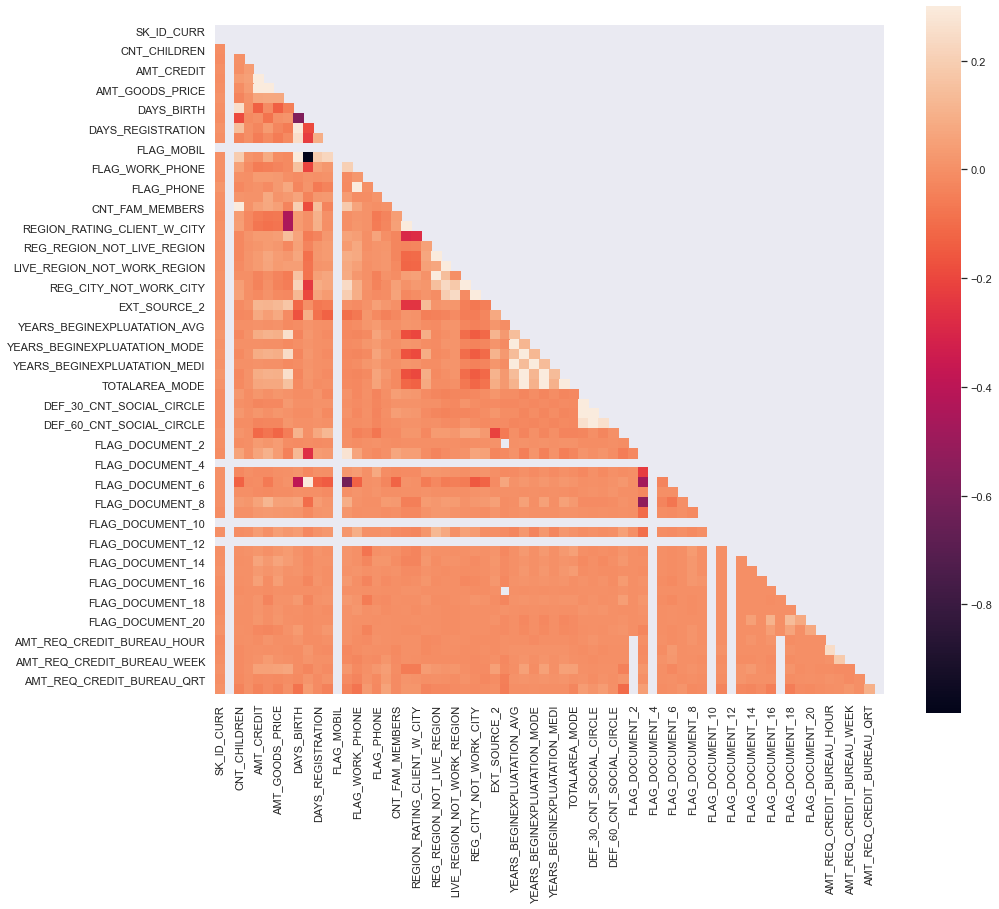

In [91]:
# Defaulter Correlation

corr1 = df_1.corr()
mask = np.zeros_like(corr1)
mask[np.triu_indices_from(mask)] = True
f , ax =plt.subplots(figsize=(15,13))
with sns.axes_style("white"):
    ax = sns.heatmap(corr1, mask=mask, vmax=.3, square=True)

### Top 10 correlation of Defaulters

In [30]:
correlation_1 = df_1.corr().abs().unstack().sort_values(kind='quicksort').dropna()
correlation_1 = correlation_1[correlation_1 != 1.0]
correlation_1.tail(10)

FLOORSMAX_MEDI                FLOORSMAX_MODE                  0.989195
FLOORSMAX_MODE                FLOORSMAX_MEDI                  0.989195
YEARS_BEGINEXPLUATATION_MEDI  YEARS_BEGINEXPLUATATION_AVG     0.996124
YEARS_BEGINEXPLUATATION_AVG   YEARS_BEGINEXPLUATATION_MEDI    0.996124
FLOORSMAX_MEDI                FLOORSMAX_AVG                   0.997187
FLOORSMAX_AVG                 FLOORSMAX_MEDI                  0.997187
OBS_60_CNT_SOCIAL_CIRCLE      OBS_30_CNT_SOCIAL_CIRCLE        0.998269
OBS_30_CNT_SOCIAL_CIRCLE      OBS_60_CNT_SOCIAL_CIRCLE        0.998269
FLAG_EMP_PHONE                DAYS_EMPLOYED                   0.999702
DAYS_EMPLOYED                 FLAG_EMP_PHONE                  0.999702
dtype: float64

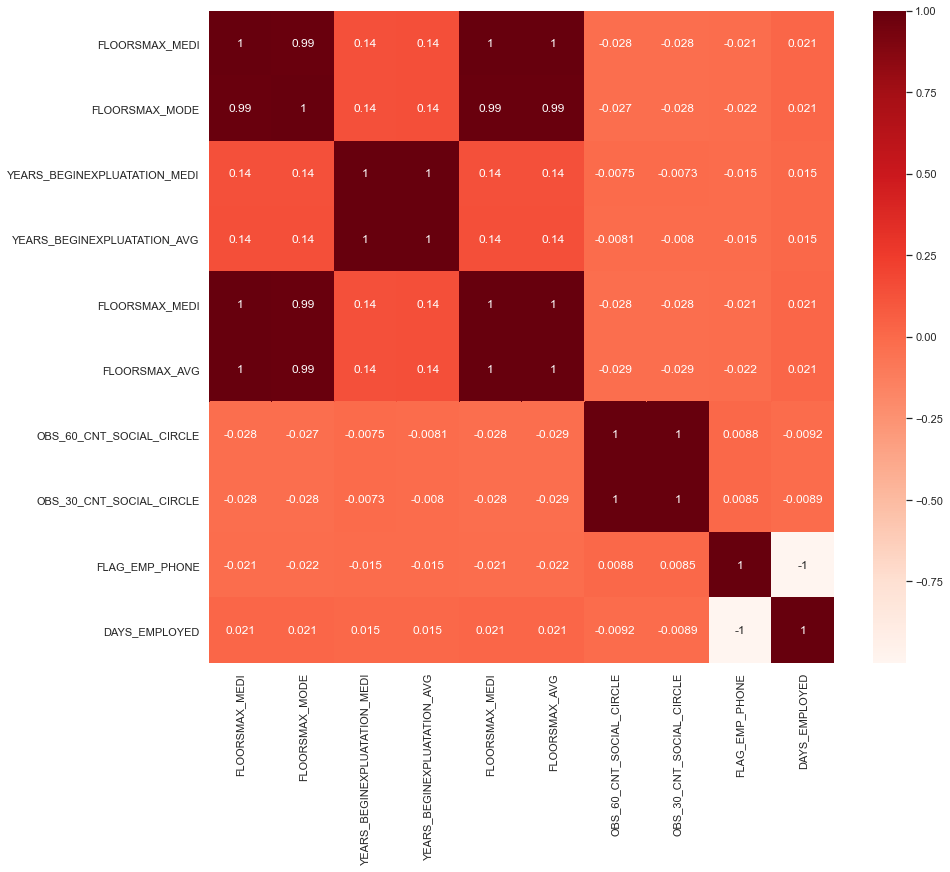

In [31]:
# Plotting a heatmap of top 10 values of correlation among Defaulters

res1 = correlation_1.tail(10).droplevel(1).index

plt.figure(figsize=[14,12])
sns.heatmap(df_1[res1].corr(), annot=True, cmap='Reds');

## <font color=navy blue>7. Analysis using 'previous_application.csv'</font>

In [93]:
# Dimensions of previous dataframe

previous.shape

(1670214, 37)

As there are more than 16 lakh rows in this dataframe, we cannot analyse it on our laptop's system.  
So, we will take a sample of 25000 values from this dataframe

In [94]:
# Take a sample of 25000 values from previous dataframe

previous = previous.sample(25000)
previous.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
766731,2099416,162601,Cash loans,9814.500,135000.0,135000.0,NaN,135000.0,MONDAY,6,Y,1,NaN,NaN,NaN,XNA,Approved,-2644,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Country-wide,-1,Consumer electronics,20.0,middle,Cash Street: middle,365243.0,-2614.0,-2044.0,-2044.0,-2036.0,0.0
1458066,1520643,452949,Consumer loans,8025.930,76455.0,84528.0,0.0,76455.0,WEDNESDAY,11,Y,1,0.000000,NaN,NaN,XAP,Approved,-322,Cash through the bank,XAP,Family,New,Furniture,POS,XNA,Stone,152,Furniture,12.0,low_normal,POS industry with interest,365243.0,-292.0,38.0,365243.0,365243.0,1.0
1035586,2142584,267830,Consumer loans,9859.455,50161.5,52812.0,0.0,50161.5,THURSDAY,17,Y,1,0.000000,NaN,NaN,XAP,Refused,-634,Cash through the bank,HC,NaN,New,Computers,POS,XNA,Country-wide,1455,Consumer electronics,6.0,middle,POS household with interest,NaN,NaN,NaN,NaN,NaN,NaN
1271710,1000347,387513,Consumer loans,4823.010,27580.5,27202.5,1660.5,27580.5,FRIDAY,10,Y,1,0.062656,NaN,NaN,XAP,Approved,-2718,Cash through the bank,XAP,Other_A,New,Consumer Electronics,POS,XNA,Country-wide,928,Consumer electronics,6.0,low_normal,POS household without interest,365243.0,-2687.0,-2537.0,-2537.0,-2534.0,1.0
1229931,2130114,275897,Consumer loans,18240.300,165987.0,165987.0,0.0,165987.0,SUNDAY,15,Y,1,0.000000,NaN,NaN,XAP,Approved,-617,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,60,Connectivity,10.0,low_normal,POS mobile without interest,365243.0,-577.0,-307.0,-307.0,-302.0,0.0


In [96]:
# Compare the number or rows of Current IDs in applications and Previous IDs in previous dataframe

print(len(previous['SK_ID_PREV'].value_counts()))   # The length of this was 16,70,214 before taking samples
print(len(applications['SK_ID_CURR'].value_counts()))

25000
307511


### **Inference**:
- The length of SK_ID_PREV in previous dataframe is $16,70,214$, but length of SK_ID_CURR in applications dataframe is $3,07,511$ which is very less. 
- From this, we can say that there are duplicate number of SK_ID_PREV

#### Now, we merge the two dataframes: applications and previous

In [97]:
# Create a dataframe called 'merged' by merging applications and previous

merged = applications.merge(previous, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')
merged.shape

(21136, 117)

In [98]:
# Take a look at the newly merged dataframe

merged.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100012,0,Revolving loans,M,N,Y,0,135000.0,405000.0,20250.0,405000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.019689,-14469,-2019,-14437.0,-3992,1,1,0,1,0,0,Laborers,1.0,2,2,THURSDAY,8,0,0,0,0,0,0,Electricity,0.746644,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-1673.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,2243829,Consumer loans,3012.075,18720.000,23697.0,0.000,18720.000,THURSDAY,9,Y,1,0.000000,NaN,NaN,XAP,Approved,-1673,XNA,XAP,Family,New,Audio/Video,POS,XNA,Country-wide,42,Connectivity,12.0,high,POS mobile with interest,365243.0,-1641.0,-1311.0,-1401.0,-1397.0,0.0
1,100075,0,Cash loans,F,N,N,0,112500.0,95940.0,10462.5,90000.0,Family,Working,Higher education,Single / not married,House / apartment,0.004960,-12240,-3720,-5246.0,-4541,1,1,0,1,0,0,NaN,1.0,2,2,MONDAY,14,0,0,0,0,0,0,University,0.664544,0.492060,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-280.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0,1596605,Revolving loans,11250.000,225000.000,225000.0,NaN,225000.000,MONDAY,15,Y,1,NaN,NaN,NaN,XAP,Approved,-280,XNA,XAP,Unaccompanied,Repeater,XNA,Cards,x-sell,Credit and cash offices,-1,XNA,0.0,XNA,Card X-Sell,-280.0,-239.0,365243.0,365243.0,365243.0,0.0
2,100083,0,Cash loans,M,Y,Y,0,103500.0,573628.5,24435.0,463500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.009657,-15406,-892,-341.0,-4176,1,1,0,1,0,0,Laborers,2.0,2,2,MONDAY,18,0,0,0,0,0,0,Business Entity Type 3,0.707126,0.597192,0.9861,0.3333,0.9861,0.3333,0.9861,0.3333,0.1324,No,2.0,1.0,2.0,1.0,-2053.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,1231722,Cash loans,11915.100,157500.000,178290.0,NaN,157500.000,MONDAY,13,Y,1,NaN,NaN,NaN,XNA,Approved,

In [99]:
# Take a look at unique values in merged dataframe

merged.SK_ID_CURR.value_counts().head()

123761    4
356267    4
316963    4
185507    4
390869    4
Name: SK_ID_CURR, dtype: int64

The merged dataframe also has multiples values for SK_ID_CURR.

#### Now, we again separate the merged dataframe based on value of TARGET variable

In [100]:
# Create two dataframes, one for Repayers (TARGET=0) and one for Defaulters (TARGET=1)

merged_0 = merged.loc[merged['TARGET']==0]
merged_1 = merged.loc[merged['TARGET']==1]

## <font color=navy blue>8. Perform Bivariate Analysis</font>

First, we define a function to create plots for doing bivariate analysis

In [101]:
def plotting2(col, hue):
 
    fig = plt.figure(figsize=(13,10))
    
    # Pie-Chart
    ax1 = plt.subplot(221)
    applications[col].value_counts().plot.pie(autopct = "%1.0f%%", ax=ax1)
    plt.title('Plotting data for the column ' + column)
    
    # Bar-plot
    ax2 = plt.subplot(222)
    df = pd.DataFrame()
    df['0'] = ((df_0[col].value_counts())/len(df_0))
    df['1'] = ((df_1[col].value_counts())/len(df_1))
    df.plot.bar(ax=ax2)
    plt.title('Plotting data for TARGET in terms of total count')
    
    # Count plot for TARGET=0
    ax3 = plt.subplot(223)
    sns.countplot(x=col, hue=hue, data=merged_0, ax=ax3)
    plt.xticks(rotation=90)
    plt.title('Plotting data for TARGET=0 in terms of percentage')
    
    # Count plot for TARGET=1
    ax4 = plt.subplot(224)
    sns.countplot(x=col, hue=hue, data=merged_1, ax=ax4)
    plt.xticks(rotation=90)
    plt.title('Plotting data for TARGET=1 in terms of percentage')
    
    fig.tight_layout()
    
    plt.show()


#### Now, we will take five pairs of variables and do bivariate analysis on them.

1. **Categorical - Categorical Bivariate Analysis**: NAME_EDUCATION_TYPE v/s NAME_CONTRACT_STATUS

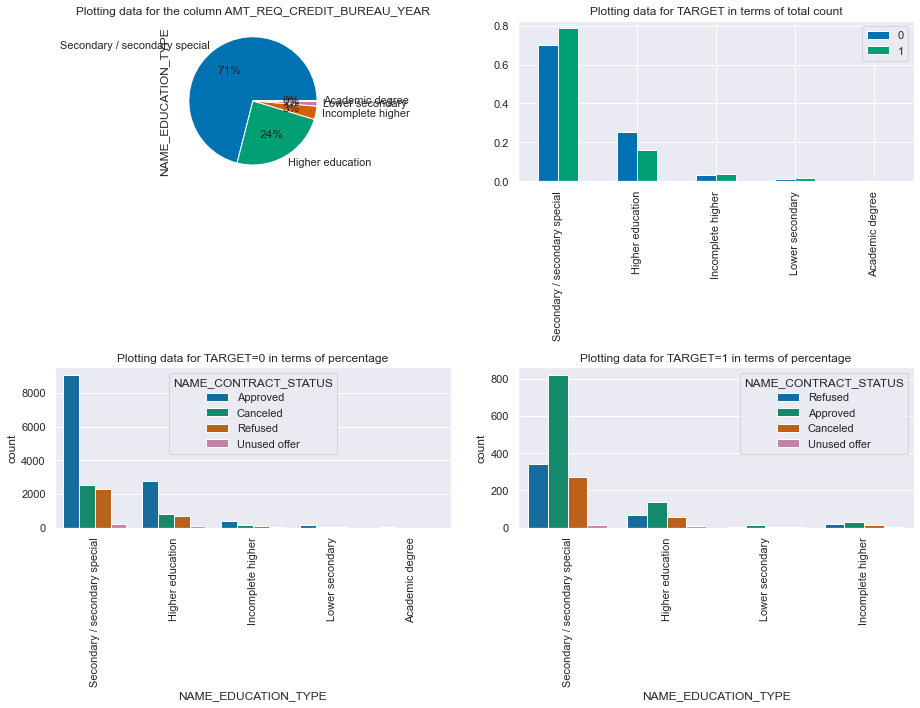

In [102]:
plotting2('NAME_EDUCATION_TYPE', 'NAME_CONTRACT_STATUS')

### **Inferences**:
 - Applicants with Secondary education are given the most loan approvals as well as refusals.
 - Very few applicants are there who haven't used their offer. So, if you offer a loan to someone after due analysis, there are high chances of the offer being used.
 - Banks should `thoroughly check poeple with Secondary education` as there are high chances of default.

2. **Categorical - Categorical Bivariate Analysis**: CODE_GENDER v/s NAME_CONTRACT_STATUS

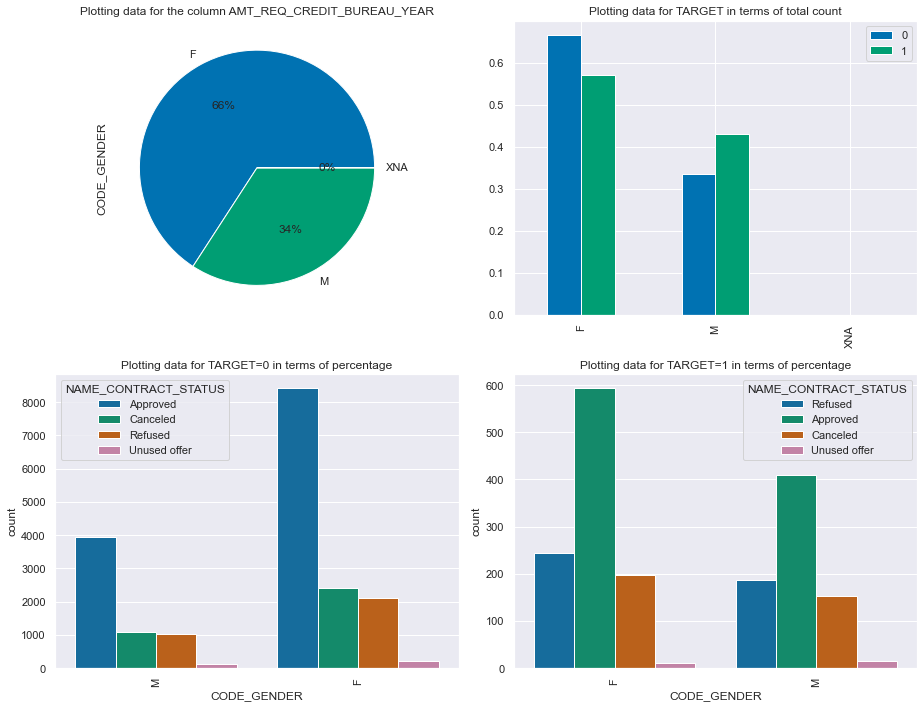

In [103]:
plotting2('CODE_GENDER', 'NAME_CONTRACT_STATUS')

### **Inferences**:
 - Female applicants are given the most loan approvals.
 - The applicants who cancel their offer are mostly people unable to pay their loans. Among them, females are higher in percentage than males.
 - In past, `banks have approved more loans to female applicants than males`, and they should continue to do so.

3. **Categorical - Categorical Bivariate Analysis**: NAME_INCOME_TYPE v/s NAME_CONTRACT_STATUS

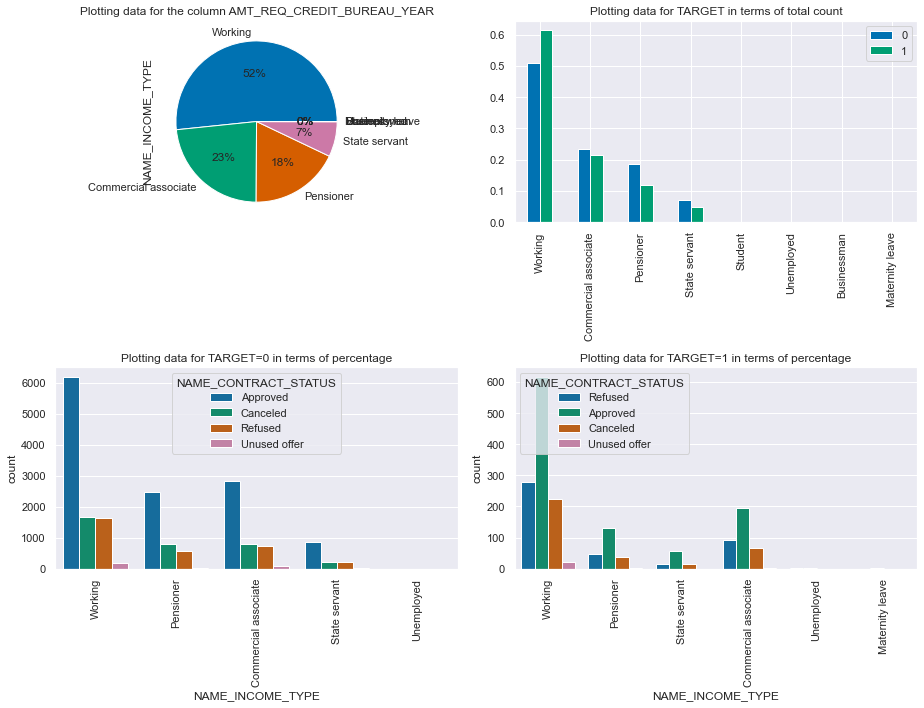

In [104]:
plotting2('NAME_INCOME_TYPE', 'NAME_CONTRACT_STATUS')

### **Inferences**:
 - Working applicants are given the most loan approvals.
 - Students are given the least loan approvals.
 - The reason for this is that working people have their source of income and can afford to repay loans while students are studying and don't have any source of income.
 - Hence, `banks should give more loans to working people and less to students`.

4. **Categorical - Categorical Bivariate Analysis**: NAME_FAMILY_STATUS v/s NAME_CONTRACT_STATUS

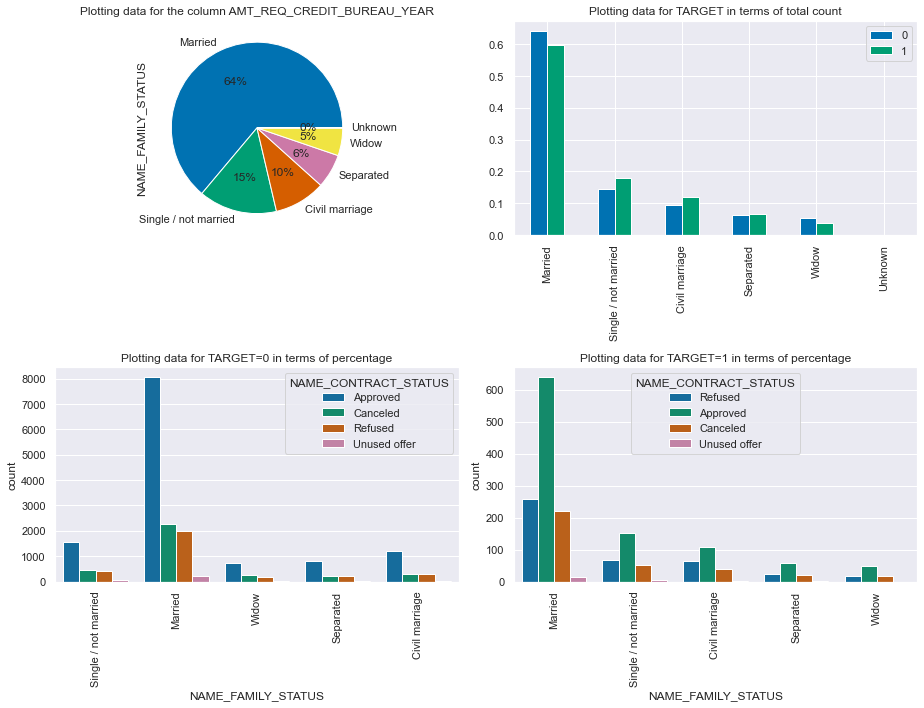

In [105]:
plotting2('NAME_FAMILY_STATUS', 'NAME_CONTRACT_STATUS')

### **Inferences**:
 - Married people are given the most loan approvals.
 - Chances of default are also highest among married people. This may be due to family expenses, which Single or Separated or Widow don't have.
 - Hence, `banks may continue to give more loans to married applicants but after due diligence.`

5. **Continuous - Categorical Bivariate Analysis**: CNT_CHILDREN v/s NAME_CONTRACT_STATUS

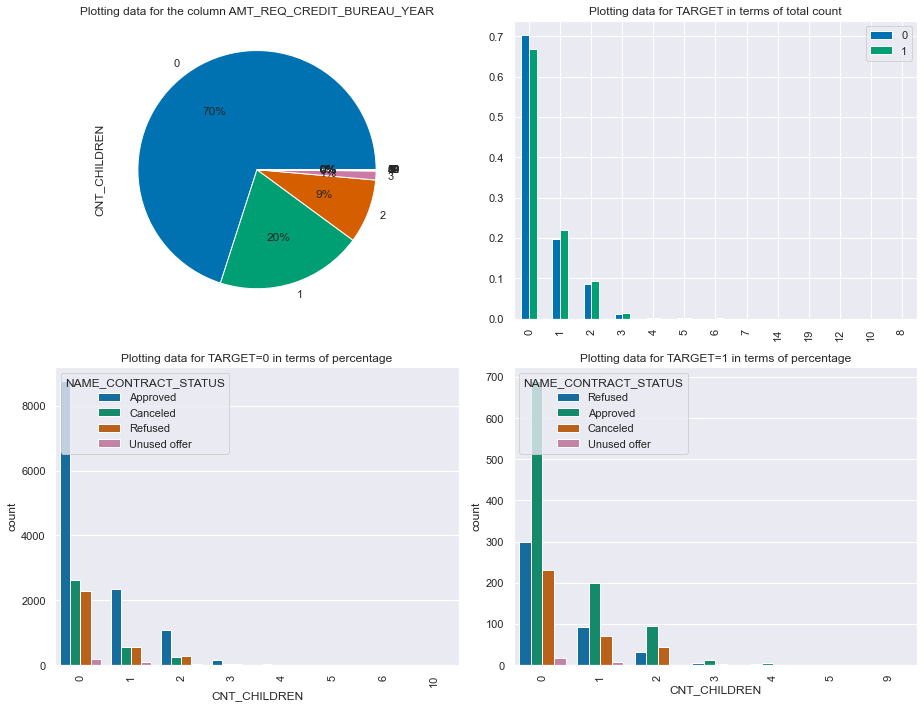

In [106]:
plotting2('CNT_CHILDREN', 'NAME_CONTRACT_STATUS')

### **Inferences**:
 - Among those getting the loan approvals, the most people have 0 children followed by those having one child.
 - In past, bank have rejected more loans where applicants had 2 or more children. They should `continue to do so.`

# END OF CASE STUDY